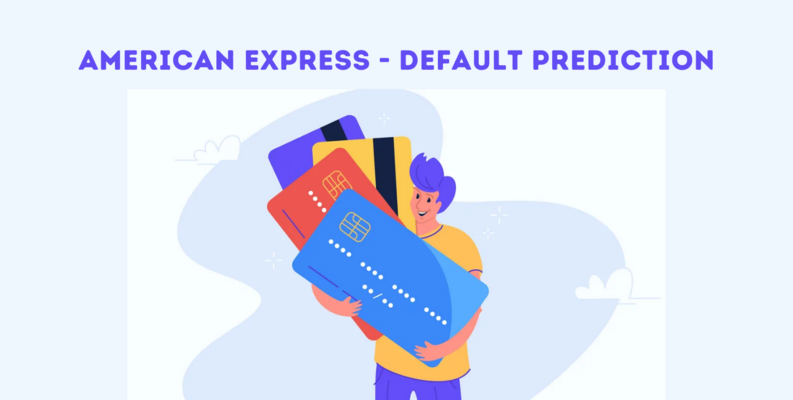

## **Introduction:**
• The objective of this project is to predict the probability that a customer does not pay back their credit card balance amount in the future based on their monthly customer profile.<br> 
• Credit default prediction is central to managing risk in a consumer lending business.<br>
• Credit default prediction allows lenders to optimize lending decisions, which leads to a better customer experience and sound business economics.<br>

## **Dataset Description:**
The dataset contains aggregated profile features for each customer at each statement date. Features are anonymized and normalized, and fall into the following general categories:

D_* = Delinquency variables<br>
S_* = Spend variables<br>
P_* = Payment variables<br>
B_* = Balance variables<br>
R_* = Risk variables<br>
With the following features being categorical: B_30, B_38, D_114, D_116, D_117, D_120, D_126, D_63, D_64,D_66, D_68

## **I. Importing Libraries:** 

In [ ]:
#import libraries
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot
import hvplot.pandas
from sklearn.decomposition import PCA
from sklearn.decomposition import FactorAnalysis
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from itertools import cycle
from sklearn.model_selection import train_test_split
from pandas.api.types import is_string_dtype,is_numeric_dtype
from itertools import product
import statsmodels.api as sm
from imblearn.over_sampling import SMOTE 

#Data model implementation
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from skopt import BayesSearchCV

# Validation 
from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report,
    roc_auc_score, roc_curve, auc, log_loss,
    plot_confusion_matrix, plot_roc_curve
)


In [ ]:
import warnings
warnings.filterwarnings("ignore")

## **II. Dataset Load:** 

We have 2 data files-
1. Main_data
2. Labels data with the 'target' output for each customer_id.<br>
After reading both files, we merge them so that we have it in one dataframe.

In [ ]:
df_main= pd.read_csv('main_data.csv')

In [ ]:
df_labels= pd.read_csv('amex_labels.csv')

In [ ]:
#Merging input data with labels to have one dataframe
df_train_Xy = pd.merge(df_main, df_labels, on='customer_ID')

In [ ]:
df_train_Xy.head()

,Unnamed: 0_x,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,...,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,Unnamed: 0_y,target
0,0,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-03-09,0.938469,0.001733,0.008724,1.006838,0.009228,0.124035,0.008771,...,NaN,0.002427,0.003706,0.003818,NaN,0.000569,0.000610,0.002674,0,0
1,1,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-04-07,0.936665,0.005775,0.004923,1.000653,0.006151,0.126750,0.000798,...,NaN,0.003954,0.003167,0.005032,NaN,0.009576,0.005492,0.009217,0,0
2,2,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-05-28,0.954180,0.091505,0.021655,1.009672,0.006815,0.123977,0.007598,...,NaN,0.003269,0.007329,0.000427,NaN,0.003429,0.006986,0.002603,0,0
3,3,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-06-13,0.960384,0.002455,0.013683,1.002700,0.001373,0.117169,0.000685,...,NaN,0.006117,0.004516,0.003200,NaN,0.008419,0.006527,0.009600,0,0
4,4,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-07-16,0.947248,0.002483,0.015193,1.000727,0.007605,0.117325,0.004653,...,NaN,0.003671,0.004946,0.008889,NaN,0.001670,0.008126,0.009827,0,0


In [ ]:
# Listing all the columns
all_cols = list(df_train_Xy.columns)
all_cols

['Unnamed: 0_x',
 'customer_ID',
 'S_2',
 'P_2',
 'D_39',
 'B_1',
 'B_2',
 'R_1',
 'S_3',
 'D_41',
 'B_3',
 'D_42',
 'D_43',
 'D_44',
 'B_4',
 'D_45',
 'B_5',
 'R_2',
 'D_46',
 'D_47',
 'D_48',
 'D_49',
 'B_6',
 'B_7',
 'B_8',
 'D_50',
 'D_51',
 'B_9',
 'R_3',
 'D_52',
 'P_3',
 'B_10',
 'D_53',
 'S_5',
 'B_11',
 'S_6',
 'D_54',
 'R_4',
 'S_7',
 'B_12',
 'S_8',
 'D_55',
 'D_56',
 'B_13',
 'R_5',
 'D_58',
 'S_9',
 'B_14',
 'D_59',
 'D_60',
 'D_61',
 'B_15',
 'S_11',
 'D_62',
 'D_63',
 'D_64',
 'D_65',
 'B_16',
 'B_17',
 'B_18',
 'B_19',
 'D_66',
 'B_20',
 'D_68',
 'S_12',
 'R_6',
 'S_13',
 'B_21',
 'D_69',
 'B_22',
 'D_70',
 'D_71',
 'D_72',
 'S_15',
 'B_23',
 'D_73',
 'P_4',
 'D_74',
 'D_75',
 'D_76',
 'B_24',
 'R_7',
 'D_77',
 'B_25',
 'B_26',
 'D_78',
 'D_79',
 'R_8',
 'R_9',
 'S_16',
 'D_80',
 'R_10',
 'R_11',
 'B_27',
 'D_81',
 'D_82',
 'S_17',
 'R_12',
 'B_28',
 'R_13',
 'D_83',
 'R_14',
 'R_15',
 'D_84',
 'R_16',
 'B_29',
 'B_30',
 'S_18',
 'D_86',
 'D_87',
 'R_17',
 'R_18',
 'D_8

In [ ]:
df_train_Xy.shape

(200000, 193)

# **III. Data Pre-processing**

## **1. Null value check**

In [ ]:
# Sorting the columns based on null value count
df_train_Xy.isnull().sum().sort_values(ascending=False)

D_87      199884
D_88      199736
D_108     198942
D_110     198768
D_111     198768
           ...  
B_24           0
D_75           0
P_4            0
B_23           0
target         0
Length: 193, dtype: int64

In [ ]:
# Calculating the percentage of nulls in the columns 
percent_missing = df_train_Xy.isnull().sum() * 100 / len(df_train_Xy)
missing_value_data = pd.DataFrame({'column_name': df_train_Xy.columns,'percent_missing': percent_missing})
missing_value_data.sort_values(by='percent_missing', ascending=False)

,column_name,percent_missing
D_87,D_87,99.942
D_88,D_88,99.868
D_108,D_108,99.471
D_110,D_110,99.384
D_111,D_111,99.384
...,...,...
B_24,B_24,0.000
D_75,D_75,0.000
P_4,P_4,0.000
B_23,B_23,0.000


In [ ]:
#Dropping features with over 70% null values
perc = 30.0
min_count =  int(((100-perc)/100)*df_train_Xy.shape[0] + 1)
Train_df = df_train_Xy.dropna( axis=1, thresh=min_count)

In [ ]:
#Null value check after dropping top 70% ones with missing values
Train_df.isnull().sum().sort_values(ascending=False)

S_27      51227
D_46      43895
S_3       37665
S_7       37665
D_62      27433
          ...  
B_23          0
S_15          0
D_71          0
B_21          0
target        0
Length: 161, dtype: int64

## **2. Data Imputation- Null value handling**

**1) Imputation using Mean** 

In [ ]:
#Imputation with mean done on top 2 attributes with missing values 
mean_imputer = SimpleImputer(strategy='mean')
Train_df['S_27'] = mean_imputer.fit_transform(Train_df['S_27'].values.reshape(-1,1))
Train_df['D_46'] = mean_imputer.fit_transform(Train_df['D_46'].values.reshape(-1,1))

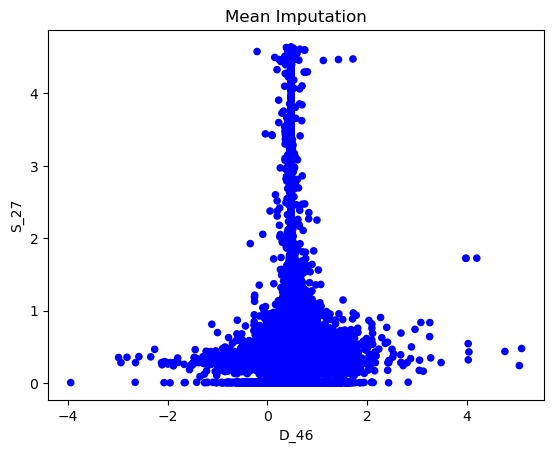

In [ ]:
# Scatter plot

fig = plt.Figure()
null_values = Train_df['S_27'].isnull()
fig = Train_df.plot(x="D_46", y='S_27', kind='scatter', c=null_values, cmap='winter', title='Mean Imputation', colorbar=False)


**2) Imputation using Mode** 

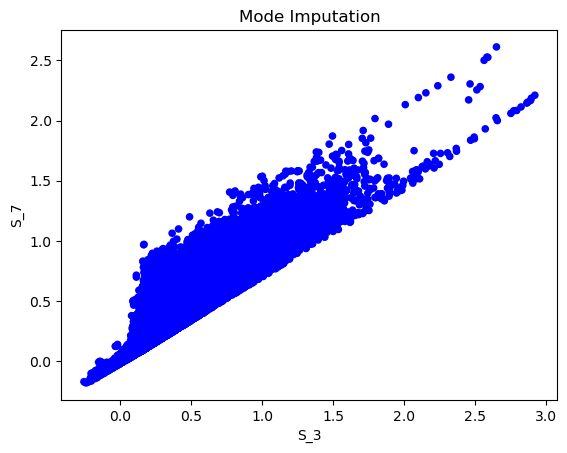

In [ ]:
# Mode Imputation
#Imputation with mode done on next 2 attributes with missing values 
mode_imputer = SimpleImputer(strategy='most_frequent')
Train_df['S_3'] = mode_imputer.fit_transform(Train_df['S_3'].values.reshape(-1,1))

# Scatter plot

fig = plt.Figure()
null_values = Train_df['S_7'].isnull()
fig = Train_df.plot(x='S_3', y='S_7', kind='scatter', c=null_values, cmap='winter', title='Mode Imputation', colorbar=False)


**3) Imputation using Ffill**

In [ ]:
# Ffill imputation
ffill_imputation = Train_df.fillna(method='ffill')

Train_df['S_7']= ffill_imputation['S_7']
Train_df['D_62']= ffill_imputation['D_62']

In [ ]:
Train_df.isnull().sum().sort_values(ascending=False)

D_48      26011
D_61      21443
P_3       10887
D_44       9929
D_78       9929
          ...  
B_21          0
S_13          0
R_6           0
S_12          0
target        0
Length: 161, dtype: int64

**Converting object datatype to categorical datatype**

In [ ]:
def str_to_cat(my_df):
    for p,q in my_df.items(): #my_df.items() is a generator in Python
        if is_string_dtype(q): 
            my_df[p] = q.astype('category').cat.as_ordered()
    return my_df

In [ ]:
Train_df = str_to_cat(Train_df)
print()

**Null value handling for entire dataframe using median imputation**

In [ ]:
#Converting all columns to numeric datatypes (required for neural network implementation)
#Reference taken from Prof's code (used on Titanic dataset in INFO6105)

def mydf_to_nums(my_df, feature, null_status):
    if not is_numeric_dtype(feature):
        my_df[null_status] = feature.cat.codes + 1

#Null value handling done by imputation method- median used in this case
def mydf_imputer(my_df, feature, null_status, null_table):
    if is_numeric_dtype(feature):
        if pd.isnull(feature).sum() or (null_status in null_table):
            my_df[null_status+'_na'] = pd.isnull(feature)
            filler = null_table[null_status] if null_status in null_table else feature.median()
            my_df[null_status] = feature.fillna(filler)
            null_table[null_status] = filler
    return null_table   

#Final fn that incorporates above 2 functions to complete pre-processing of the dataframe
def mydf_preprocessor(my_df, null_table):
    '''null_table  = your table or None'''
    
    if null_table is None: 
        null_table = dict()
    for p,q in my_df.items(): 
        null_table = mydf_imputer(my_df, q, p, null_table)
    for p,q in my_df.items(): 
        mydf_to_nums(my_df, q, p)
    my_df = pd.get_dummies(my_df, dummy_na = True)
    res = [my_df, null_table]
    return res

In [ ]:
# Implementing above pre-processor function on our dataframe
Train_df, my_table = mydf_preprocessor(Train_df,null_table = None)

In [ ]:
Train_df.head()

,Unnamed: 0_x,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,...,B_41_na,D_130_na,D_131_na,D_133_na,D_139_na,D_140_na,D_141_na,D_143_na,D_144_na,D_145_na
0,0,1,9,0.938469,0.001733,0.008724,1.006838,0.009228,0.124035,0.008771,...,False,False,False,False,False,False,False,False,False,False
1,1,1,38,0.936665,0.005775,0.004923,1.000653,0.006151,0.126750,0.000798,...,False,False,False,False,False,False,False,False,False,False
2,2,1,89,0.954180,0.091505,0.021655,1.009672,0.006815,0.123977,0.007598,...,False,False,False,False,False,False,False,False,False,False
3,3,1,105,0.960384,0.002455,0.013683,1.002700,0.001373,0.117169,0.000685,...,False,False,False,False,False,False,False,False,False,False
4,4,1,138,0.947248,0.002483,0.015193,1.000727,0.007605,0.117325,0.004653,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
# Listing all the columns
all_cols = list(Train_df.columns)
all_cols

['Unnamed: 0_x',
 'customer_ID',
 'S_2',
 'P_2',
 'D_39',
 'B_1',
 'B_2',
 'R_1',
 'S_3',
 'D_41',
 'B_3',
 'D_44',
 'B_4',
 'D_45',
 'B_5',
 'R_2',
 'D_46',
 'D_47',
 'D_48',
 'B_6',
 'B_7',
 'B_8',
 'D_51',
 'B_9',
 'R_3',
 'D_52',
 'P_3',
 'B_10',
 'S_5',
 'B_11',
 'S_6',
 'D_54',
 'R_4',
 'S_7',
 'B_12',
 'S_8',
 'D_55',
 'B_13',
 'R_5',
 'D_58',
 'B_14',
 'D_59',
 'D_60',
 'D_61',
 'B_15',
 'S_11',
 'D_62',
 'D_63',
 'D_64',
 'D_65',
 'B_16',
 'B_18',
 'B_19',
 'B_20',
 'D_68',
 'S_12',
 'R_6',
 'S_13',
 'B_21',
 'D_69',
 'B_22',
 'D_70',
 'D_71',
 'D_72',
 'S_15',
 'B_23',
 'P_4',
 'D_74',
 'D_75',
 'B_24',
 'R_7',
 'B_25',
 'B_26',
 'D_78',
 'D_79',
 'R_8',
 'S_16',
 'D_80',
 'R_10',
 'R_11',
 'B_27',
 'D_81',
 'S_17',
 'R_12',
 'B_28',
 'R_13',
 'D_83',
 'R_14',
 'R_15',
 'D_84',
 'R_16',
 'B_30',
 'S_18',
 'D_86',
 'R_17',
 'R_18',
 'B_31',
 'S_19',
 'R_19',
 'B_32',
 'S_20',
 'R_20',
 'R_21',
 'B_33',
 'D_89',
 'R_22',
 'R_23',
 'D_91',
 'D_92',
 'D_93',
 'D_94',
 'R_24',
 'R

In [ ]:
#Sorting column names in ascending order
cols = Train_df.columns
cols = [cols[0]]+sorted(cols[1:-1],key = lambda k:k[0])+[cols[-1]]
Train_df= Train_df[cols]
Train_df

,Unnamed: 0_x,B_1,B_2,B_3,B_4,B_5,B_6,B_7,B_8,B_9,...,S_27,S_22_na,S_23_na,S_24_na,S_25_na,S_26_na,Unnamed: 0_y,customer_ID,target,D_145_na
0,0,0.008724,1.006838,0.004709,0.080986,0.170600,0.063902,0.059416,0.006466,0.008207,...,0.676922,False,False,False,False,False,0,1,0,False
1,1,0.004923,1.000653,0.002714,0.069419,0.113239,0.065261,0.057744,0.001614,0.008373,...,0.822281,False,False,False,False,False,0,1,0,False
2,2,0.021655,1.009672,0.009423,0.068839,0.060492,0.066982,0.056647,0.005126,0.009355,...,0.853498,False,False,False,False,False,0,1,0,False
3,3,0.013683,1.002700,0.005531,0.055630,0.166782,0.083720,0.049253,0.001418,0.006782,...,0.844667,False,False,False,False,False,0,1,0,False
4,4,0.015193,1.000727,0.009312,0.038862,0.143630,0.075900,0.048918,0.001199,0.000519,...,0.811199,False,False,False,False,False,0,1,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,199995,0.006173,1.006607,0.014583,0.005547,0.026292,0.121392,0.019991,1.007281,0.006486,...,0.009652,False,False,False,False,False,16575,16576,0,False
199996,199996,0.014536,0.816225,0.011436,0.020602,0.012180,0.138287,0.022339,1.006993,0.007024,...,0.009405,False,False,False,False,False,16575,16576,0,False
199997,199997,0.010878,0.815024,0.008332,0.014219,0.012390,0.086974,0.017381,1.001861,0.004900,...,0.002664,False,False,False,False,False,16575,16576,0,False
199998,199998,0.013903,1.008488,0.010484,0.125175,0.004984,0.079123,0.100139,1.007477,0.001398,...,0.006272,False,False,False,False,False,16575,16576,0,False


**Merging the input data with the labels data created 2 index columns- Dropping them as we don't need it for any analysis** 

In [ ]:
Train_df= Train_df.drop([Train_df.columns[0], Train_df.columns[-4]], axis=1)

In [ ]:
Train_df.head()

,B_1,B_2,B_3,B_4,B_5,B_6,B_7,B_8,B_9,B_10,...,S_26,S_27,S_22_na,S_23_na,S_24_na,S_25_na,S_26_na,customer_ID,target,D_145_na
0,0.008724,1.006838,0.004709,0.080986,0.170600,0.063902,0.059416,0.006466,0.008207,0.096219,...,0.001243,0.676922,False,False,False,False,False,1,0,False
1,0.004923,1.000653,0.002714,0.069419,0.113239,0.065261,0.057744,0.001614,0.008373,0.099804,...,0.004561,0.822281,False,False,False,False,False,1,0,False
2,0.021655,1.009672,0.009423,0.068839,0.060492,0.066982,0.056647,0.005126,0.009355,0.134073,...,0.011736,0.853498,False,False,False,False,False,1,0,False
3,0.013683,1.002700,0.005531,0.055630,0.166782,0.083720,0.049253,0.001418,0.006782,0.134437,...,0.007571,0.844667,False,False,False,False,False,1,0,False
4,0.015193,1.000727,0.009312,0.038862,0.143630,0.075900,0.048918,0.001199,0.000519,0.121518,...,0.018200,0.811199,False,False,False,False,False,1,0,False


In [ ]:
# Checking the datatype of the columns
Train_df.dtypes.to_list()

[dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('int64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('float64'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('bool'),
 dtype('float6

# **III. Exploratory Data Analysis** 

**Analysing customer statements with the 'Transaction date' attribute to understand the data duration**

In [ ]:
# Analysing customer statements over a year
stat_plot = df_train_Xy.reset_index().groupby('S_2')['customer_ID'].nunique().reset_index()
fig = go.Figure()
fig.add_trace(go.Scatter(x = stat_plot['S_2'], y = stat_plot['customer_ID']))
fig.update_layout(title="Customer Statements", width = 800, height = 600,xaxis_title ='Statement Date', yaxis_title= 'Number of transactions',
                  paper_bgcolor='rgb(0,0,0,0)',plot_bgcolor='rgb(0,0,0,0)') 
fig['data'][0]['line']['color']="#ff9770"
fig.show()

**The plot explains that we have customer transaction data for the duration of a year** 

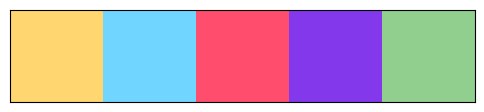

In [ ]:
#Custom Color Palette 🎨
custom_colors = ["#ffd670","#70d6ff","#ff4d6d","#8338ec","#90cf8e"]
customPalette = sns.set_palette(sns.color_palette(custom_colors))
sns.palplot(sns.color_palette(custom_colors),size=1.2)
plt.tick_params(axis='both', labelsize=0, length = 0)

In [ ]:
# Categorical variables in the dataset
cat_cols = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']

In [ ]:
#Distribution analysis of each variable
feat_Delinquency = [c for c in Train_df.columns if c.startswith('D_')]
feat_Spend = [c for c in Train_df.columns if c.startswith('S_')]
feat_Payment = [c for c in Train_df.columns if c.startswith('P_')]
feat_Balance = [c for c in Train_df.columns if c.startswith('B_')]
feat_Risk = [c for c in Train_df.columns if c.startswith('R_')]
print(f'Total number of Delinquency variables: {len(feat_Delinquency)}')
print(f'Total number of Spend variables: {len(feat_Spend)}')
print(f'Total number of Payment variables: {len(feat_Payment)}')
print(f'Total number of Balance variables: {len(feat_Balance)}')
print(f'Total number of Risk variables: {len(feat_Risk)}')

Total number of Delinquency variables: 124
Total number of Spend variables: 26
Total number of Payment variables: 5
Total number of Balance variables: 55
Total number of Risk variables: 29


In [ ]:
labels=['Delinquency', 'Spend','Payment','Balance','Risk']
values= [len(feat_Delinquency), len(feat_Spend),len(feat_Payment), len(feat_Balance),len(feat_Risk)]

In [ ]:
#Ploting the feature distribution 
fig_1 = go.Figure()
fig_1.add_trace(go.Pie(values = values,labels = labels,hole = 0.6, 
                     hoverinfo ='label+percent'))
fig_1.update_traces(textfont_size = 12, hoverinfo ='label+percent',textinfo ='label', 
                  showlegend = False,marker = dict(colors =["#70d6ff","#ff9770"]),
                  title = dict(text = 'Customer Profile Feature Distribution'))  
fig_1.show()


In [ ]:
# Calculating the target column distribution
target_class = pd.DataFrame({'count': Train_df.target.value_counts(),
                             'percentage': Train_df['target'].value_counts() / Train_df.shape[0] * 100
})
target_class 

,count,percentage
0,149321,74.6605
1,50679,25.3395


In [ ]:
# Ploting the target column distribution
target_class.rename(index={1:'Default',0:'Paid'},inplace=True)
fig = go.Figure()
fig.add_trace(go.Pie(values = target_class['count'],labels = target_class.index,hole = 0.6, showlegend=True,
                     hoverinfo ='label+percent'))
fig.update_traces(textfont_size = 12, hoverinfo ='label+percent',textinfo ='label', 
                  showlegend = True, marker = dict(colors =["#90cf8e","#ff70a6"]),
                  title = dict(text = 'Target Distribution'))  
fig.show()

In [ ]:
#Dropping S_2 which holds the transaction date value
df_train_Xy= df_train_Xy.drop('S_2', axis= 1)
df_train_Xy.head()

,Unnamed: 0_x,customer_ID,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,...,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,Unnamed: 0_y,target
0,0,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,0.938469,0.001733,0.008724,1.006838,0.009228,0.124035,0.008771,0.004709,...,NaN,0.002427,0.003706,0.003818,NaN,0.000569,0.000610,0.002674,0,0
1,1,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,0.936665,0.005775,0.004923,1.000653,0.006151,0.126750,0.000798,0.002714,...,NaN,0.003954,0.003167,0.005032,NaN,0.009576,0.005492,0.009217,0,0
2,2,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,0.954180,0.091505,0.021655,1.009672,0.006815,0.123977,0.007598,0.009423,...,NaN,0.003269,0.007329,0.000427,NaN,0.003429,0.006986,0.002603,0,0
3,3,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,0.960384,0.002455,0.013683,1.002700,0.001373,0.117169,0.000685,0.005531,...,NaN,0.006117,0.004516,0.003200,NaN,0.008419,0.006527,0.009600,0,0
4,4,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,0.947248,0.002483,0.015193,1.000727,0.007605,0.117325,0.004653,0.009312,...,NaN,0.003671,0.004946,0.008889,NaN,0.001670,0.008126,0.009827,0,0


## **Distribution Analysis and Correlation of Customer profile variables** 

In [ ]:
#Creating different dataframes for different variables for further analysis
del_cols = [c for c in df_train_Xy.columns if (c.startswith(('D','t'))) & (c not in cat_cols)]
df_del = df_train_Xy[del_cols]
spd_cols = [c for c in df_train_Xy.columns if (c.startswith(('S','t'))) & (c not in cat_cols)]
df_spd = df_train_Xy[spd_cols]
pay_cols = [c for c in df_train_Xy.columns if (c.startswith(('P','t'))) & (c not in cat_cols)]
df_pay = df_train_Xy[pay_cols]
bal_cols = [c for c in df_train_Xy.columns if (c.startswith(('B','t'))) & (c not in cat_cols)]
df_bal = df_train_Xy[bal_cols]
ris_cols = [c for c in df_train_Xy.columns if (c.startswith(('R','t'))) & (c not in cat_cols)]
df_ris = df_train_Xy[ris_cols]

In [ ]:
#Ploting the Distribution of all the Delinquency variables
fig, axes = plt.subplots(22, 3, figsize = (35,150))
for i, ax in enumerate(axes.reshape(-1)):
    if i < len(del_cols) - 1:
        sns.kdeplot(x = del_cols[i], hue='target', data = df_del, fill = True, ax = ax, palette =["#e63946","#8338ec"])
        ax.tick_params()
        ax.xaxis.get_label()
        ax.set_ylabel('')
fig.suptitle('Distribution of Delinquency Variables', fontsize = 35, x = 0.5, y = 1)
plt.tight_layout()
plt.show()

> **Remarks:** 
>
> The bigger the distance and the less overlapping between two distribution curves the better discriminator this feature will be.<br>
There are many variables that are skewed towards the end


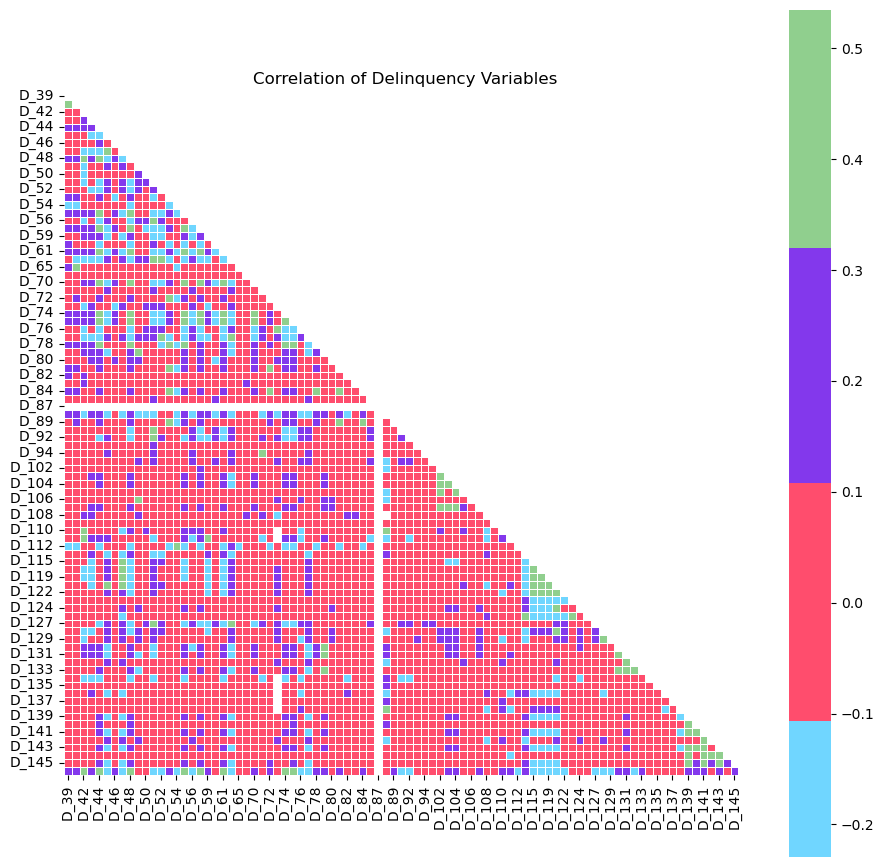

In [ ]:
#Ploting the Correlation of Delinquency Variables
plt.figure(figsize =(11,11))
corr = df_del.corr()
mask = np.triu(np.ones_like(corr, dtype = bool))
sns.heatmap(corr, mask = mask, robust = True, center = 0,square = True, linewidths =.6, cmap = custom_colors)
plt.title('Correlation of Delinquency Variables')
plt.show()

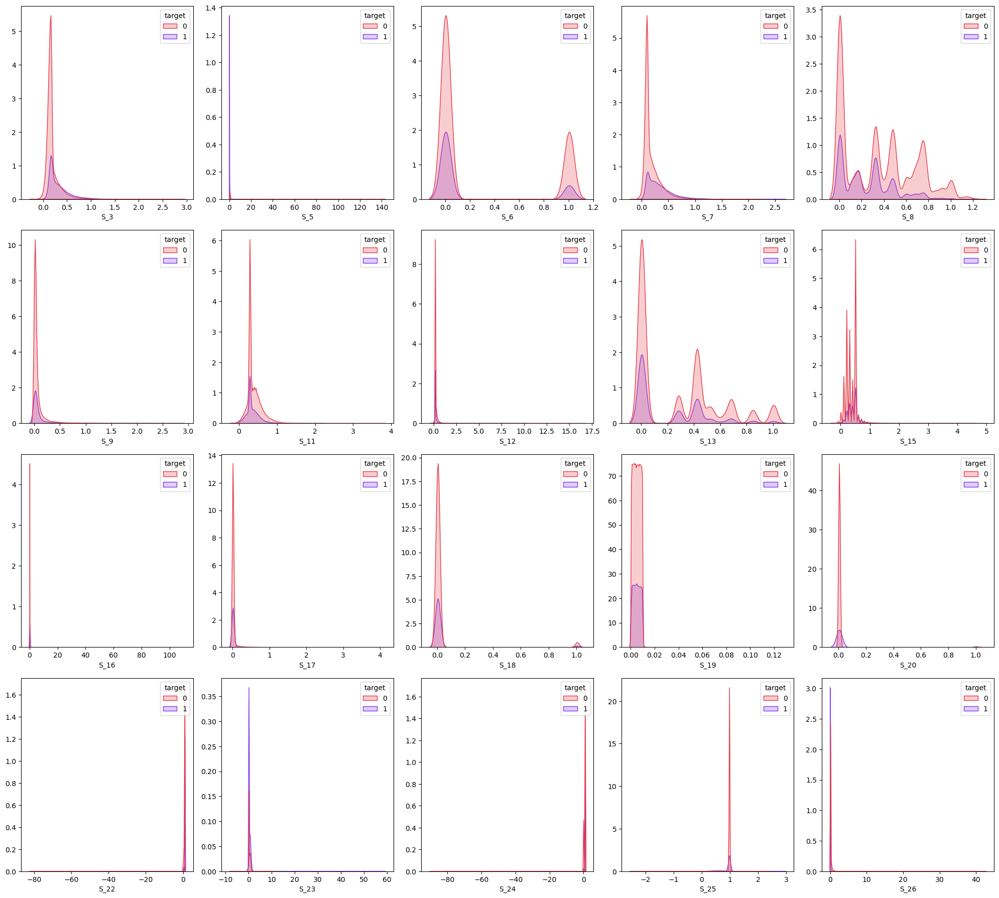

In [ ]:
#Ploting the Distribution of all the Spend variables
ig, axes = plt.subplots(4, 5, figsize = (20,18))
fig.suptitle('Distribution of Spend Variables', fontsize = 15, x = 0.5, y = 1)
for i, ax in enumerate(axes.reshape(-1)):
    if i < len(spd_cols) - 1:
        sns.kdeplot(x = spd_cols[i], hue ='target', data = df_spd, fill = True, ax = ax, palette =["#e63946","#8338ec"])
        ax.tick_params()
        ax.xaxis.get_label()
        ax.set_ylabel('')
plt.tight_layout()
plt.show()

> **Remarks**:
>
> The bigger the distance and the less overlapping between two distribution curves the better discriminator this feature is. <br>
There are some variables that are skewed towards the end

In [ ]:
S_cols = [c for c in df_train_Xy.columns if (c.startswith(('S')))]
df_S = df_train_Xy[S_cols]

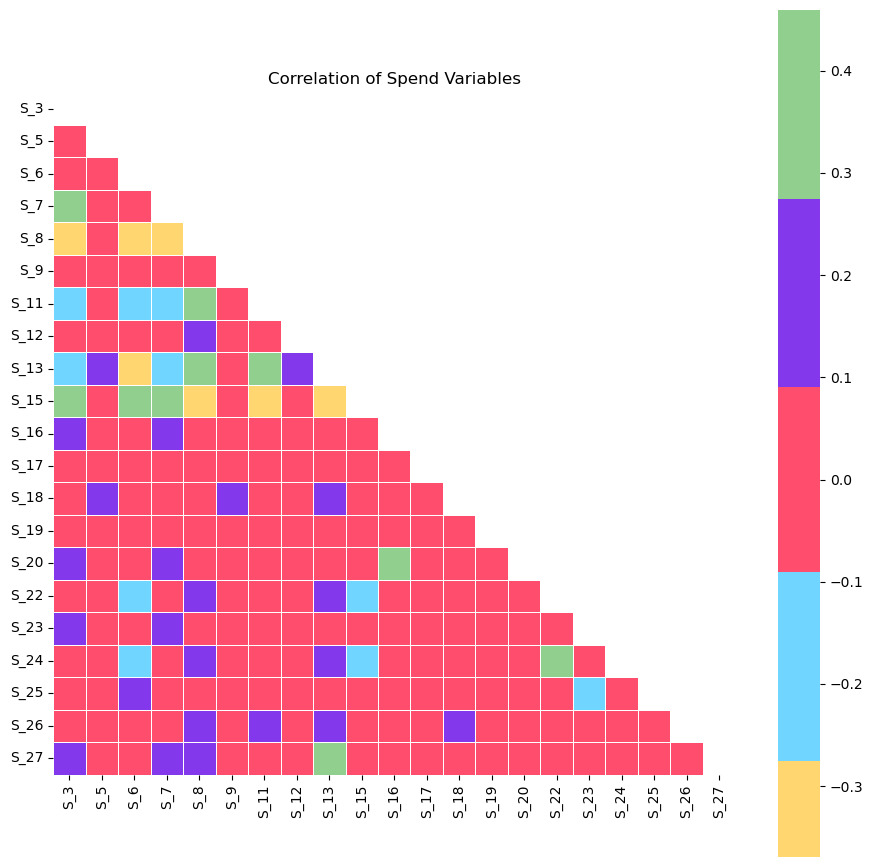

In [ ]:
#Ploting the Correlation of Spend Variables
plt.figure(figsize = (11,11))
corr = df_S.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask = mask, robust = True, center = 0,square = True, linewidths = .6, cmap = custom_colors)
plt.title('Correlation of Spend Variables')
plt.show()

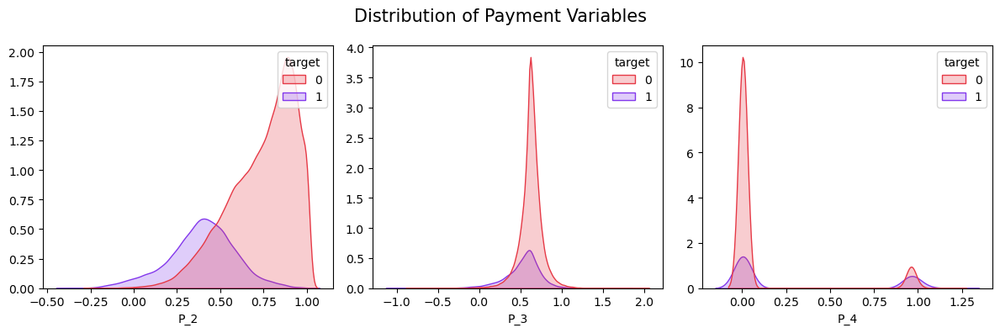

In [ ]:
#Ploting the Distribution of all the Payment variables
fig, axes = plt.subplots(1, 3, figsize = (12,4))
fig.suptitle('Distribution of Payment Variables',fontsize = 15)
for i, ax in enumerate(axes.reshape(-1)):
    if i < len(pay_cols) - 1:
        sns.kdeplot(x = pay_cols[i], hue ='target', data = df_pay, fill = True, ax = ax, palette =["#e63946","#8338ec"])
        ax.tick_params()
        ax.xaxis.get_label()
        ax.set_ylabel('')
plt.tight_layout()
plt.show()

> **Remarks:**
>
> P_2 variable appears to have skewed distribution <br>
P_3 variable appears to have normal distribution <br>
P_4 variable appears to have bimodal distribution 


In [ ]:
P_cols = [c for c in df_train_Xy.columns if (c.startswith(('P')))]
df_P = df_train_Xy[P_cols]

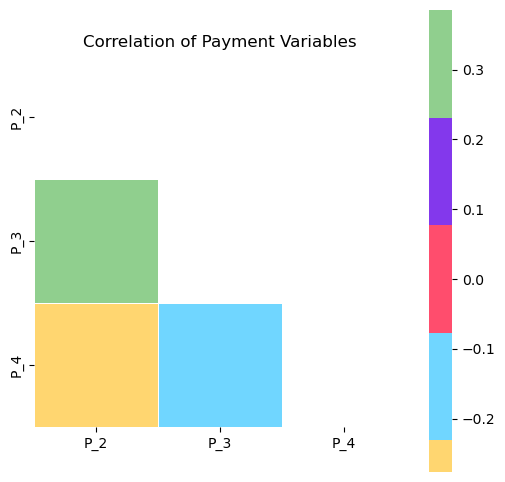

In [ ]:
#Ploting the Correlation of Payment Variables
plt.figure(figsize = (6,6))
corr = df_P.corr()
mask = np.triu(np.ones_like(corr, dtype = bool))
sns.heatmap(corr, mask = mask, robust = True, center = 0,square = True, linewidths = .6, cmap = custom_colors)
plt.title('Correlation of Payment Variables')
plt.show()

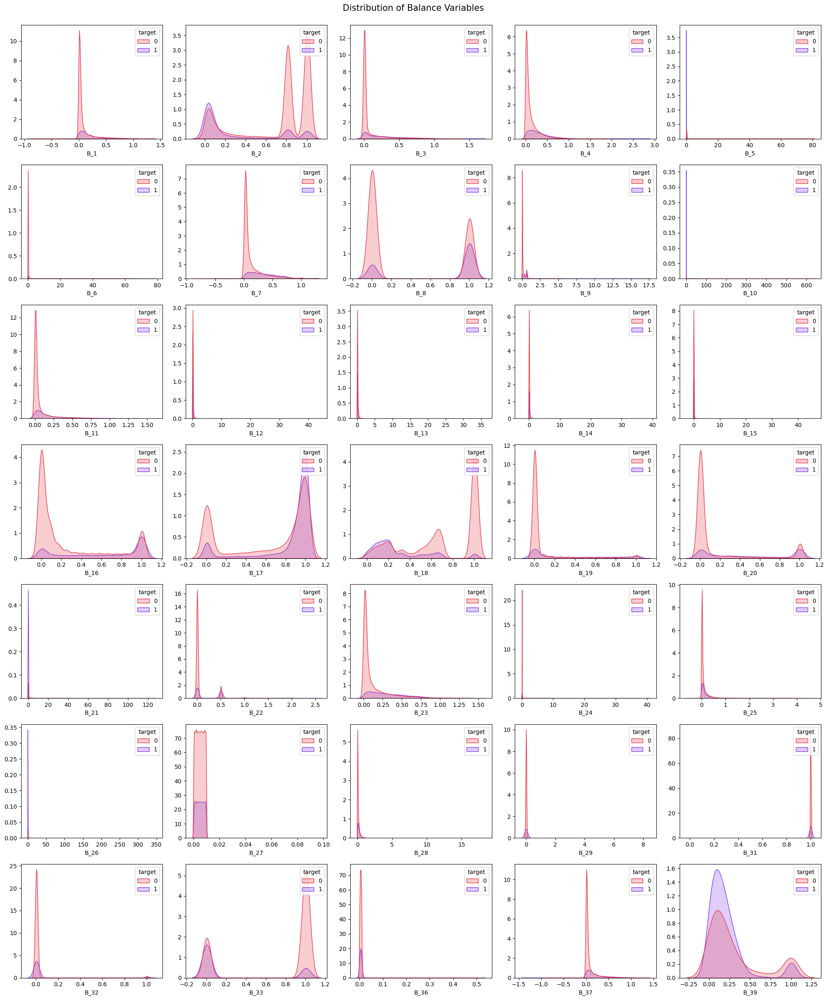

In [ ]:
#Ploting the Distribution of all the Balance variables
fig, axes = plt.subplots(7, 5, figsize = (20,24))
fig.suptitle('Distribution of Balance Variables',fontsize = 15, x = 0.5, y = 1)
for i, ax in enumerate(axes.reshape(-1)):
    if i < len(bal_cols) - 1:
        sns.kdeplot(x = bal_cols[i], hue ='target', data = df_bal, fill = True, ax = ax, palette =["#e63946","#8338ec"])
        ax.tick_params()
        ax.xaxis.get_label()
        ax.set_ylabel('')
plt.tight_layout()
plt.show()

> **Remarks:**
>
>The bigger the distance and the less overlapping between two distribution curves the better discriminator this feature is. <br>
There are some variables that are skewed towards the end


In [ ]:
B_cols = [c for c in df_train_Xy.columns if (c.startswith(('B')))]
df_B = df_train_Xy[B_cols]

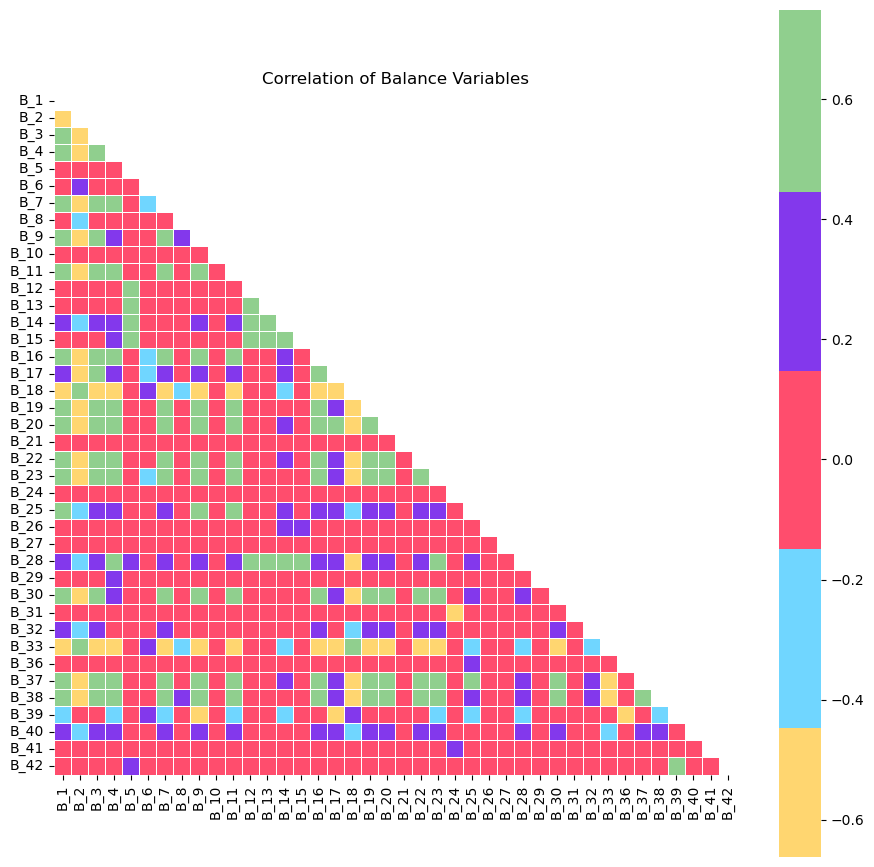

In [ ]:
#Ploting the Correlation of Balance Variables
plt.figure(figsize = (11,11))
corr = df_B.corr()
mask = np.triu(np.ones_like(corr, dtype = bool))
sns.heatmap(corr, mask = mask, robust=True, center = 0,square = True, linewidths =.6, cmap = custom_colors)
plt.title('Correlation of Balance Variables')
plt.show()

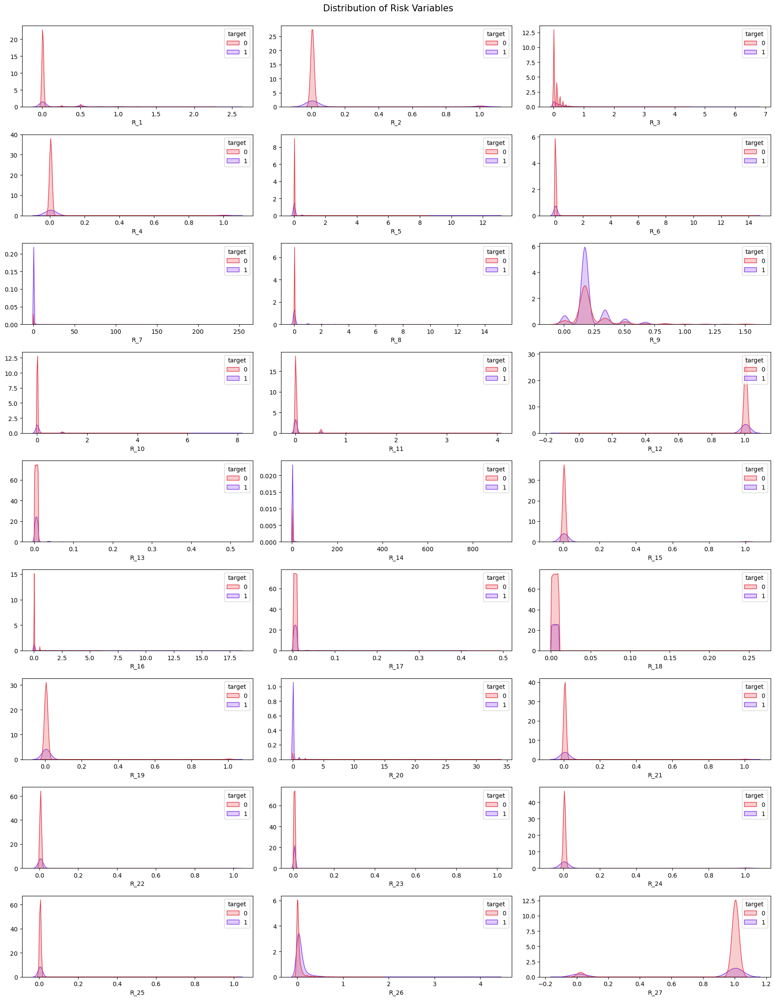

In [ ]:
#Ploting the Distribution of all the Risk variables
fig, axes = plt.subplots(9, 3, figsize = (18,23))
fig.suptitle('Distribution of Risk Variables',fontsize=15, x = 0.5, y = 1)
for i, ax in enumerate(axes.reshape(-1)):
    if i < len(ris_cols) - 1:
        sns.kdeplot(x = ris_cols[i], hue ='target', data = df_ris, fill = True, ax = ax, palette =["#e63946","#8338ec"])
        ax.tick_params()
        ax.xaxis.get_label()
        ax.set_ylabel('')
plt.tight_layout()
plt.show()

> **Remarks:**
>
> Above plot shows distribution for R variables and skewness in distribution <br>
There are many variables which appear to be having extreme form of value

In [ ]:
R_cols = [c for c in df_train_Xy.columns if (c.startswith(('R')))]
df_R = df_train_Xy[R_cols]

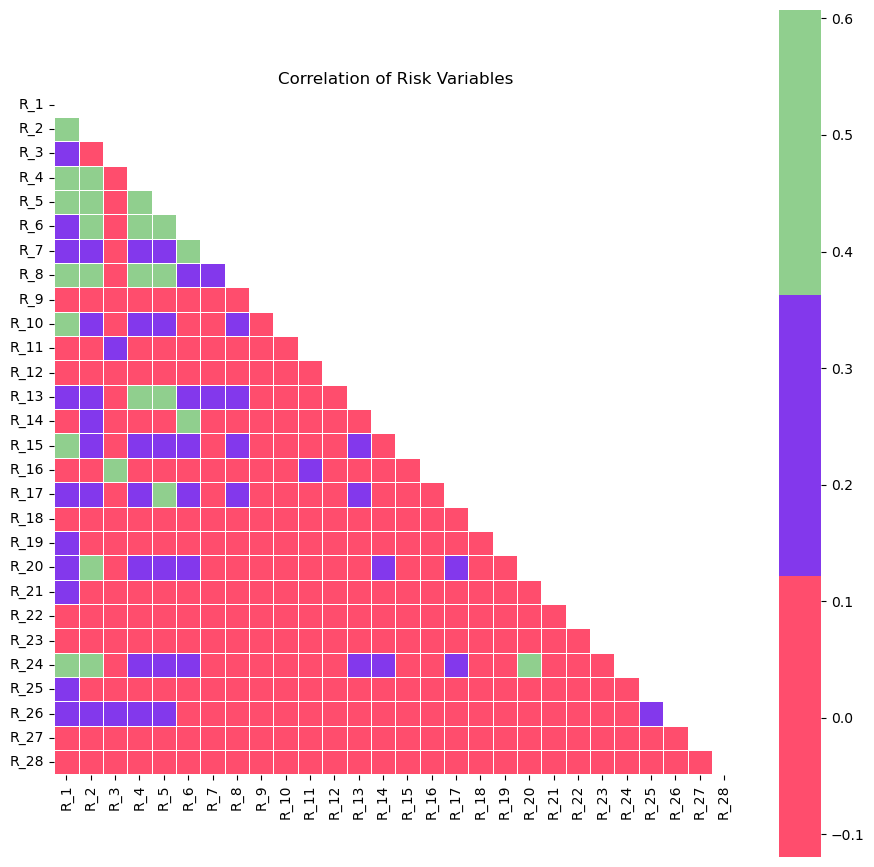

In [ ]:
#Ploting the Correlation of Risk Variables
plt.figure(figsize=(11,11))
corr = df_R.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask = mask, robust = True, center = 0, square = True, linewidths =.6, cmap = custom_colors)
plt.title('Correlation of Risk Variables')
plt.show()

## **Correlation of profile features with the target**

In [ ]:
#Correlation of the independent features with the target
corr=Train_df.corr()
corr=corr['target'].sort_values(ascending=False)[1:-1]
pal=sns.color_palette("Reds_r",135).as_hex()
rgb=['rgba'+str(matplotlib.colors.to_rgba(i,0.7)) for i in pal]
fig = go.Figure()
fig.add_trace(go.Bar(x=corr[corr>=0], y=corr[corr>=0].index, 
                     marker_color=rgb, orientation='h', 
                     marker_line=dict(color=pal,width=2), name='',
                     hovertemplate='%{y} correlation with target: %{x:.3f}',
                     showlegend=False))
pal=sns.color_palette("Blues",100).as_hex()
rgb=['rgba'+str(matplotlib.colors.to_rgba(i,0.7)) for i in pal]
fig.add_trace(go.Bar(x=corr[corr<0], y=corr[corr<0].index, 
                     marker_color=rgb[25:], orientation='h', 
                     marker_line=dict(color=pal[25:],width=2), name='',
                     hovertemplate='%{y} correlation with target: %{x:.3f}',
                     showlegend=False))
fig.update_layout(title="Feature Correlations with Target",
                  xaxis_title="Correlation", margin=dict(l=150),
                  height=3000, width=700, hovermode='closest')
fig.show()

> We found a lot collinear variables. 
>
> B_2, B_33 and P_33= variables that negatively correlate to the target output the most <br>
D_48, D_61, D_44= variables that positively correlate to the target output the most
>
>
> These variables will let us solve not only the problem of dimensionality curse but also noises during computatuion, which undermines our statistical inference thus model performances. Let us do a dimensional reduction by the category.

### **Get records for each unique customer_ID**

In [ ]:
# grouping the values on 'customerID'
Train_df = Train_df.groupby('customer_ID').tail(1)
Train_df.shape

(16576, 241)

# **IV. Feature Engineering- Dimensionality Reduction- PCA**

In [ ]:
# Prepare for a PCA 
Master_df = Train_df[['customer_ID','target']].reset_index(drop = True)

# Numeric and Normalize
PCA_Numeric = Train_df.select_dtypes(include=['float64']).reset_index(drop = True)

for i in PCA_Numeric.columns:
    PCA_Numeric[i] = PCA_Numeric[i].astype('float64')
    PCA_Numeric[i] = PCA_Numeric[i].fillna(PCA_Numeric[i].mean())

PCA_Numeric = pd.DataFrame(StandardScaler().fit_transform(PCA_Numeric), columns = PCA_Numeric.columns)
    
# Concat
PCA_df = PCA_Numeric

In [ ]:
PCA_df.head()

,B_1,B_2,B_3,B_4,B_5,B_6,B_7,B_8,B_9,B_10,...,S_17,S_18,S_19,S_20,S_22,S_23,S_24,S_25,S_26,S_27
0,-0.565063,1.020848,-0.587597,-0.497528,0.560712,0.022514,-0.598253,-0.970814,-0.681707,0.023196,...,-0.135290,-0.125422,-0.504049,-0.075601,0.259371,-0.192630,0.325971,0.250209,-0.142174,1.996706
1,-0.456703,1.012106,-0.595889,-0.704366,-0.175133,0.064033,-0.720028,-0.974724,-0.670055,0.015690,...,-0.140049,0.037829,0.020500,-0.075108,0.265245,-0.189559,0.317060,0.274146,-0.137867,-0.039801
2,-0.586899,0.549899,-0.587513,-0.661414,-0.266585,0.100785,-0.725830,-0.976179,-0.682197,0.015478,...,-0.162062,-0.115531,0.408083,-0.071050,-0.914059,-0.190058,-1.066089,0.251785,-0.134540,-0.078564
3,-0.551436,1.017312,-0.576720,-0.759578,0.154900,0.079421,-0.786740,1.036110,-0.643946,0.045353,...,-0.130649,-0.141605,0.068481,-0.093599,0.285749,-0.189650,0.360442,0.258836,-0.047578,1.202396
4,-0.572357,0.557377,-0.594078,0.321369,-0.254732,-0.208882,-0.186871,1.035356,-0.700628,-0.028856,...,-0.132376,-0.141912,0.320814,-0.133984,-0.923648,-0.191770,-1.073726,0.249836,-0.139801,-0.078564


In [ ]:
PCA_Model = PCA(n_components=3, random_state=0)

for cat in ['S','R','B','P','D']:
    
    Temp = pd.DataFrame(PCA_Model.fit_transform(PCA_df[[i for i in PCA_df.columns if cat in i]]))
    Temp.columns = [cat +'_'+ str(name) for name in Temp.columns]
    Master_df = pd.concat([Master_df, Temp], axis = 1)
    
Master_df.head()

,customer_ID,target,S_0,S_1,S_2,R_0,R_1,R_2,B_0,B_1,B_2,P_0,P_1,P_2,D_0,D_1,D_2
0,1,0,-1.554119,0.740688,0.666069,-0.794814,0.642050,-0.252302,-2.883529,0.163159,-0.447487,-1.072875,0.103091,0.568817,-3.562944,1.541309,-3.689560
1,2,0,-0.652521,0.082307,-0.327853,-0.677699,0.417634,-0.191059,-2.943058,-0.272268,-0.569896,-0.740979,0.264111,0.628106,-3.291201,-0.003706,1.221365
2,3,0,2.863426,0.843081,0.289833,-0.759477,0.669297,-0.239762,-3.035160,-0.323168,-0.436096,-0.940629,0.139543,0.422772,-2.810748,-0.650546,1.552084
3,4,0,-0.421614,-0.772633,0.233257,-0.731389,-1.840730,0.964373,-2.897377,-0.276420,-0.167896,-0.430148,0.148053,-0.425052,-2.493705,-1.667045,0.077766
4,5,0,2.800641,1.109482,0.189251,-0.885652,0.615660,-0.165628,-2.003327,-0.205451,0.199999,-0.712402,0.256653,0.609376,-0.564619,2.067474,-2.045823


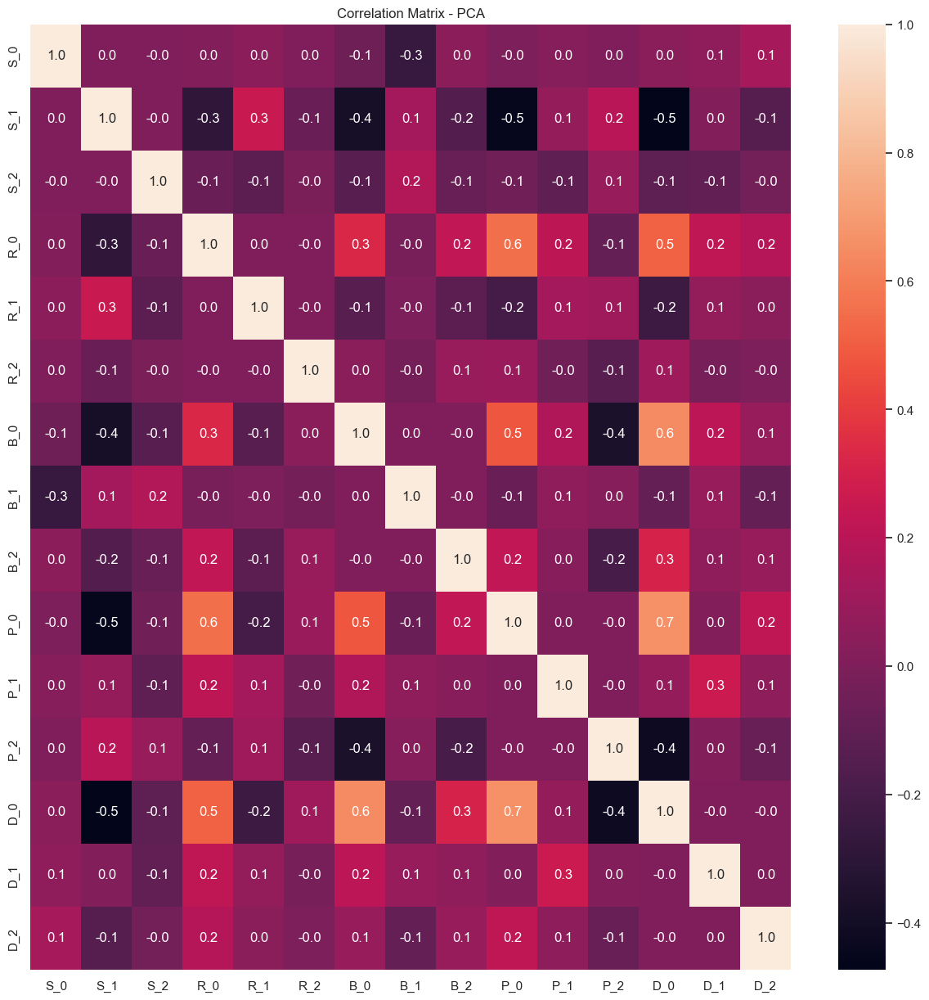

In [ ]:
#Correlation matrix - PCA
sns.set_theme()
plt.figure(figsize=(15, 15))
sns.heatmap(Master_df.iloc[:, 2:].corr(),annot = True, fmt='.1f')
plt.title('Correlation Matrix - PCA')
plt.show()

> D_0 and P_0 show high positive correlation <br>
P_0 and R_0 show high positive correlation <br>
D_0 and R_0 show high positive correlation <br>
D_0 and S1_1 show comparitively high negative correlation <br>


**A scree plot is plotted to determine the suggested number of PCA components for our model**

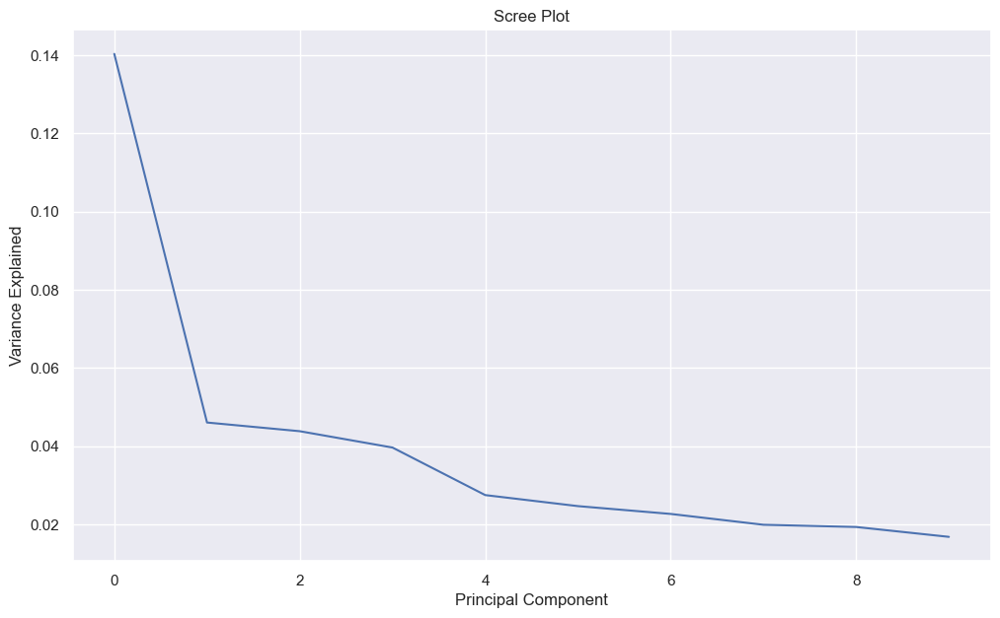

In [ ]:
# Scree Plot 
PCA_Model = PCA(n_components=10, random_state=0)
PCA_Model.fit(PCA_df)

plt.figure(figsize=(12, 7))
plt.plot(PCA_Model.explained_variance_ratio_)
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

**The optimal number of compontents should be around 4-6. Let us use 6 componentents for our models.**

In [ ]:
PCA_Model = PCA(n_components=6, random_state=0)
Temp = pd.DataFrame(PCA_Model.fit_transform(PCA_df))
Master_df = pd.concat([Master_df.iloc[:, :2], Temp], axis = 1)
Master_df

,customer_ID,target,0,1,2,3,4,5
0,1,0,-4.820921,2.620617,1.507651,1.453332,2.103451,-2.619796
1,2,0,-4.394528,0.016376,0.958683,-0.704372,-1.485855,-0.151344
2,3,0,-4.462273,-1.361960,0.759251,-2.263016,-0.986943,1.598756
3,4,0,-3.718651,-1.366168,-0.102853,1.400759,-0.472610,0.133108
4,5,0,-2.263391,-0.070704,0.451543,-2.697977,3.605532,1.176810
...,...,...,...,...,...,...,...,...
16571,16572,0,-1.494605,0.814623,3.793824,0.100833,-2.468372,-1.386600
16572,16573,0,-1.780837,0.675171,0.035044,-0.958873,1.360440,-0.050396
16573,16574,0,-0.882124,2.820520,1.759226,-2.696370,2.942305,0.359264
16574,16575,0,-3.931642,0.788671,0.832966,0.275903,0.860818,-1.425368


In [ ]:
Regression = sm.add_constant(Master_df.iloc[:,2:])
logit_mod = sm.Logit(Master_df['target'], Regression)
logit_res = logit_mod.fit()
print(logit_res.summary())

Optimization terminated successfully.
         Current function value: 0.276944
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                 target   No. Observations:                16576
Model:                          Logit   Df Residuals:                    16569
Method:                           MLE   Df Model:                            6
Date:                Thu, 08 Dec 2022   Pseudo R-squ.:                  0.5208
Time:                        15:43:29   Log-Likelihood:                -4590.6
converged:                       True   LL-Null:                       -9579.9
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.7681      0.037    -48.110      0.000      -1.840      -1.696
0              0.6063      0.

> After a complete PCA, all variables are now significant (p<0.05). The pseudo R-squ (0.5261) is just slighly lower than the model with the above with collinear. The next step will be building a data model on the PCA data.

# V. Data Model Implementation

**As mentioned above that the target ratio is 3:1 which may cause bias on our models, let us use SMOTE oversampling method to make create a balance sample.**

In [ ]:
sm = SMOTE(random_state=42)
X, y = sm.fit_resample(Master_df.iloc[:,2:], Master_df['target'])

In [ ]:
y.value_counts()

0    12188
1    12188
Name: target, dtype: int64

In [ ]:
# Train Test Split
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
def amex_metric(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:

    def top_four_percent_captured(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:
        df = (pd.concat([y_true, y_pred], axis='columns')
              .sort_values('prediction', ascending=False))
        df['weight'] = df['target'].apply(lambda x: 20 if x==0 else 1)
        four_pct_cutoff = int(0.04 * df['weight'].sum())
        df['weight_cumsum'] = df['weight'].cumsum()
        df_cutoff = df.loc[df['weight_cumsum'] <= four_pct_cutoff]
        return (df_cutoff['target'] == 1).sum() / (df['target'] == 1).sum()
        
    def weighted_gini(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:
        df = (pd.concat([y_true, y_pred], axis='columns')
              .sort_values('prediction', ascending=False))
        df['weight'] = df['target'].apply(lambda x: 20 if x==0 else 1)
        df['random'] = (df['weight'] / df['weight'].sum()).cumsum()
        total_pos = (df['target'] * df['weight']).sum()
        df['cum_pos_found'] = (df['target'] * df['weight']).cumsum()
        df['lorentz'] = df['cum_pos_found'] / total_pos
        df['gini'] = (df['lorentz'] - df['random']) * df['weight']
        return df['gini'].sum()

    def normalized_weighted_gini(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:
        y_true_pred = y_true.rename(columns={'target': 'prediction'})
        return weighted_gini(y_true, y_pred) / weighted_gini(y_true, y_true_pred)

    g = normalized_weighted_gini(y_true, y_pred)
    d = top_four_percent_captured(y_true, y_pred)

    return 0.5 * (g + d)


def plot_roc(y_val,y_prob):
    colors=px.colors.qualitative.Prism
    fig=go.Figure()
    fig.add_trace(go.Scatter(x=np.linspace(0,1,11), y=np.linspace(0,1,11), 
                             name='Random Chance',mode='lines', showlegend=False,
                             line=dict(color="Black", width=1, dash="dot")))
    for i in range(len(y_val)):
        y=y_val[i]
        prob=y_prob[i]
        fpr, tpr, _ = roc_curve(y, prob)
        roc_auc = auc(fpr,tpr)
        fig.add_trace(go.Scatter(x=fpr, y=tpr, line=dict(color=colors[::-1][i+1], width=3), 
                                 hovertemplate = 'True positive rate = %{y:.3f}<br>False positive rate = %{x:.3f}',
                                 name='Fold {}:  Gini = {:.3f}, AUC = {:.3f}'.format(i+1, gini[i],roc_auc)))
    fig.update_layout(template=temp, title="Cross-Validation ROC Curves", 
                      hovermode="x unified", width=700,height=600,
                      xaxis_title='False Positive Rate (1 - Specificity)',
                      yaxis_title='True Positive Rate (Sensitivity)',
                      legend=dict(orientation='v', y=.07, x=1, xanchor="right",
                                  bordercolor="black", borderwidth=.5))
    fig.show()

In [ ]:
#Defined to print performance metrics for all our models in a consistent format

def print_score(true, pred, train=True):
    if train:
        clf_report = pd.DataFrame(classification_report(true, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(true, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(true, pred)}\n")
        
    elif train==False:
        clf_report = pd.DataFrame(classification_report(true, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(true, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(true, pred)}\n")

## **1.  Logistic Regression**

**Code for hyper-parameter tuning incorporated in the function Logit_Randomize_CV**

In [ ]:
# Randomized Cross Validation for Hyperparameters Tuning

def Logit_Randomize_CV(X,y, parameters, k = -1):
    
    # Create Parameter Combination
    keys, values = zip(*parameters.items())
    result = [dict(zip(keys, p)) for p in product(*values)]
    
    if k != -1:

        result = np.random.choice(result, k, replace = False)
    
    best_score = -1
    best_parameter = {}
    best_model = None
    
    # Train Test Split
    train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.3, random_state=42)
    
    for i in result:
        
        Logit = LogisticRegression(**i)
        Logit.fit(train_X, train_y)
        
        pred = Logit.predict(test_X)
        amex_actual = pd.DataFrame({'target':test_y}).reset_index(drop=True)
        amex_prediction = pd.DataFrame({'prediction': Logit.predict_proba(test_X)[:, 1]}).reset_index(drop=True)
        score = amex_metric(amex_actual,amex_prediction)
        
        if score > best_score:
            best_score = score
            best_parameter = i
            best_model = Logit
        
        print(f'{i}: {score}')
        
    print(f'Best Parameters - {best_parameter}: {best_score}')
    
    return best_model

### **Hyper parameter tuning check**

In [ ]:
# Pools of Parameters
random_parameters = {'solver': ['newton-cg', 'lbfgs', 'liblinear'],
                     'C' :[100, 10, 1.0, 0.1, 0.01]
                    }
#Prints all parameters till it reaches the best ones
Logit = Logit_Randomize_CV(train_X,train_y, random_parameters)

{'solver': 'newton-cg', 'C': 100}: 0.6478999180328648
{'solver': 'newton-cg', 'C': 10}: 0.6479000708357061
{'solver': 'newton-cg', 'C': 1.0}: 0.6478997652300236
{'solver': 'newton-cg', 'C': 0.1}: 0.647897931595928
{'solver': 'newton-cg', 'C': 0.01}: 0.6469151428781279
{'solver': 'lbfgs', 'C': 100}: 0.6479003764413889
{'solver': 'lbfgs', 'C': 10}: 0.6479002236385475
{'solver': 'lbfgs', 'C': 1.0}: 0.6479000708357062
{'solver': 'lbfgs', 'C': 0.1}: 0.647897931595928
{'solver': 'lbfgs', 'C': 0.01}: 0.6469148372724454
{'solver': 'liblinear', 'C': 100}: 0.6478990012158171
{'solver': 'liblinear', 'C': 10}: 0.6478999180328648
{'solver': 'liblinear', 'C': 1.0}: 0.6478985428072932
{'solver': 'liblinear', 'C': 0.1}: 0.6477193740270734
{'solver': 'liblinear', 'C': 0.01}: 0.6475664873355576
Best Parameters - {'solver': 'lbfgs', 'C': 100}: 0.6479003764413889


> For our model, the best parameters for Logistic Regression are: <br>
    {'solver': 'lbfgs', 'C': 100}

In [ ]:
# Implenting Logistic Regression function on our train dataset and then test dataset
log_train_pred= Logit.predict(train_X)
log_test_pred = Logit.predict(test_X)
# amex_actual = pd.DataFrame({'target':test_y}).reset_index(drop=True)
# amex_prediction = pd.DataFrame({'prediction': Logit.predict_proba(test_X)[:, 1]}).reset_index(drop=True)


In [ ]:
#Printing performance metrics for Logistic Regression (hyper parameter included)
print_score(train_y, log_train_pred, train= True)
print_score(test_y, log_test_pred, train=False)

Train Result:
Accuracy Score: 86.81%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy     macro avg  weighted avg
precision     0.870460     0.865738  0.868077      0.868099      0.868094
recall        0.864224     0.871915  0.868077      0.868069      0.868077
f1-score      0.867331     0.868815  0.868077      0.868073      0.868074
support    8514.000000  8549.000000  0.868077  17063.000000  17063.000000
_______________________________________________
Confusion Matrix: 
 [[7358 1156]
 [1095 7454]]

Test Result:
Accuracy Score: 87.21%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.876547     0.867791  0.872145     0.872169      0.872190
recall        0.867719     0.876614  0.872145     0.872167      0.872145
f1-score      0.872111     0.872180  0.872145     0.872145      0.872145
support    3674.000000  363

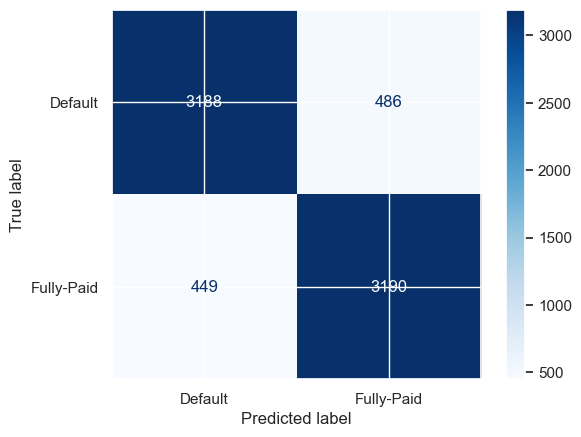

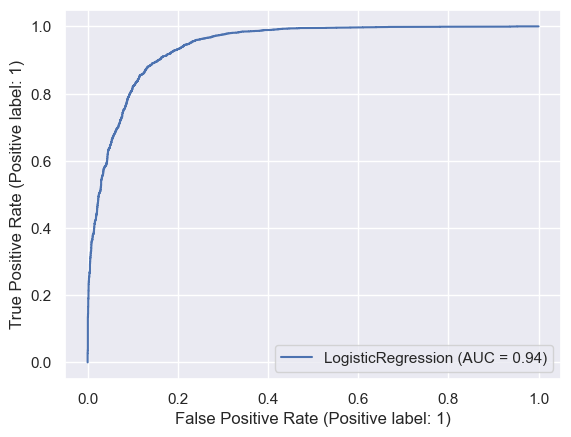

In [ ]:
#Plotting confusion matrix and roc curve 
disp = plot_confusion_matrix(
    Logit, test_X, test_y, 
    cmap='Blues', values_format='d', 
    display_labels=['Default', 'Fully-Paid']
)

disp = plot_roc_curve(Logit, test_X, test_y)

In [ ]:
#Adding all roc scores to a score dictionary to give a summarised visualization in the end
scores_dict = {
    'LogisticRegression': {
        'Train': roc_auc_score(train_y, Logit.predict(train_X)),
        'Test': roc_auc_score(test_y, Logit.predict(test_X)),
    }
}

## **2. XGBoost**

In [ ]:
train_X = np.array(train_X).astype(np.float32)
test_X = np.array(test_X).astype(np.float32)
train_y = np.array(train_y).astype(np.float32)
test_y = np.array(test_y).astype(np.float32)

In [ ]:
#Implemnting XGBoost Classifier model on our train and test dataset (no hyper-parameter tuning done yet)

xgb_clf = XGBClassifier(use_label_encoder=False)
xgb_clf.fit(train_X, train_y)

y_train_pred = xgb_clf.predict(train_X)
y_test_pred = xgb_clf.predict(test_X)

#Printing performance metrics
print_score(train_y, y_train_pred, train=True)
print_score(test_y, y_test_pred, train=False)

Train Result:
Accuracy Score: 95.18%
_______________________________________________
CLASSIFICATION REPORT:
                   0.0          1.0  accuracy     macro avg  weighted avg
precision     0.971205     0.933947  0.951767      0.952576      0.952538
recall        0.930937     0.972511  0.951767      0.951724      0.951767
f1-score      0.950645     0.952839  0.951767      0.951742      0.951744
support    8514.000000  8549.000000  0.951767  17063.000000  17063.000000
_______________________________________________
Confusion Matrix: 
 [[7926  588]
 [ 235 8314]]

Test Result:
Accuracy Score: 88.62%
_______________________________________________
CLASSIFICATION REPORT:
                   0.0          1.0  accuracy    macro avg  weighted avg
precision     0.915740     0.860334   0.88623     0.888037       0.88817
recall        0.851932     0.920857   0.88623     0.886395       0.88623
f1-score      0.882685     0.889567   0.88623     0.886126       0.88611
support    3674.000000  363

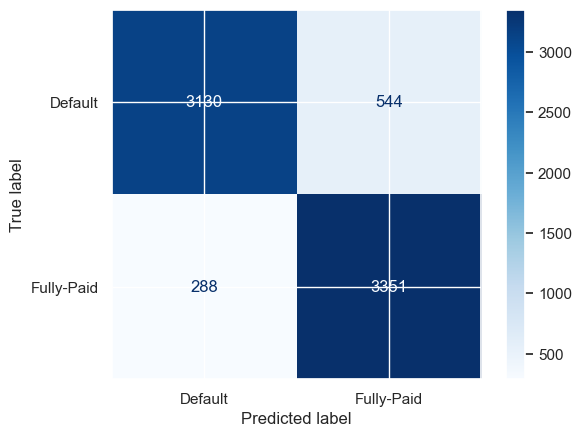

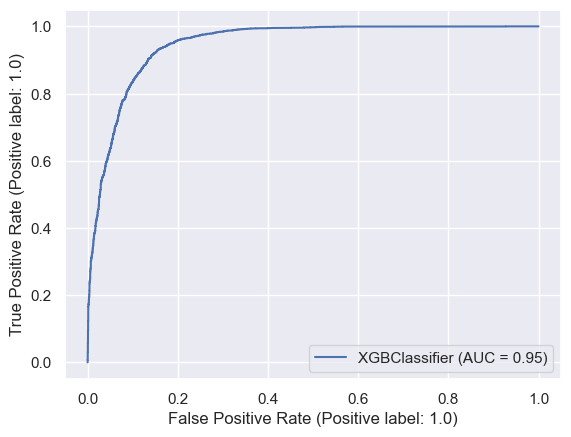

In [ ]:
#Displaying confusion matrix
disp = plot_confusion_matrix(
    xgb_clf, test_X, test_y, 
    cmap='Blues', values_format='d', 
    display_labels=['Default', 'Fully-Paid']
)

#Plotting roc curve
disp = plot_roc_curve(xgb_clf, test_X, test_y)

## **i. Hyper parameter tuning for XGBoost Classifier- GridSearch** 

In [ ]:
#Checking default parameters used before hyper parameter tuning
default_params = {}
gparams = xgb_clf.get_params()
gparams

{'objective': 'binary:logistic',
 'use_label_encoder': False,
 'base_score': 0.5,
 'booster': 'gbtree',
 'callbacks': None,
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': 0,
 'gpu_id': -1,
 'grow_policy': 'depthwise',
 'importance_type': None,
 'interaction_constraints': '',
 'learning_rate': 0.300000012,
 'max_bin': 256,
 'max_cat_threshold': 64,
 'max_cat_to_onehot': 4,
 'max_delta_step': 0,
 'max_depth': 6,
 'max_leaves': 0,
 'min_child_weight': 1,
 'missing': nan,
 'monotone_constraints': '()',
 'n_estimators': 100,
 'n_jobs': 0,
 'num_parallel_tree': 1,
 'predictor': 'auto',
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'sampling_method': 'uniform',
 'scale_pos_weight': 1,
 'subsample': 1,
 'tree_method': 'exact',
 'validate_parameters': 1,
 'verbosity': None}

In [ ]:
#default parameters have to be wrapped in lists - even single values - so GridSearchCV can take them as inputs
for key in gparams.keys():
    gp = gparams[key]
    default_params[key] = [gp]

In [ ]:
#GridSearchCV implemented as a hyper parameter technique
clf_hyper = GridSearchCV(estimator=xgb_clf, scoring='accuracy', param_grid=default_params, return_train_score=True, verbose=1, cv=3)
clf_hyper.fit(train_X, train_y.ravel())

Fitting 3 folds for each of 1 candidates, totalling 3 fits


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     callbacks=None, colsample_bylevel=1,
                                     colsample_bynode=1, colsample_bytree=1,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=0, gpu_id=-1,
                                     grow_policy='depthwise',
                                     importance_type=None,
                                     interaction_constraints='',
                                     learning_rate=0.300000012...
                         'learning_rate': [0.300000012], 'max_bin': [256],
                         'max_cat_threshold': [64], 'max_cat_to_onehot': [4],
                         'max_delta_step': [0], 'max_depth': [6],
                         'max_leaves': [0], 'min_child_weight': [1],
                         'missing': [nan], 'monotone_constraints': ['()'],
                         'n_estimators': [100], 'n_jobs': [0],
                         'num_parallel_tree': [1],
                         'objective': ['binary:logistic'],
                         'predictor': ['auto'], ...},
             return_train_score=True, scoring='accuracy', verbose=1)

In [ ]:
#Printing the best parameters defined by GridSearchCV
bp = clf_hyper.best_params_
bp

{'base_score': 0.5,
 'booster': 'gbtree',
 'callbacks': None,
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': 0,
 'gpu_id': -1,
 'grow_policy': 'depthwise',
 'importance_type': None,
 'interaction_constraints': '',
 'learning_rate': 0.300000012,
 'max_bin': 256,
 'max_cat_threshold': 64,
 'max_cat_to_onehot': 4,
 'max_delta_step': 0,
 'max_depth': 6,
 'max_leaves': 0,
 'min_child_weight': 1,
 'missing': nan,
 'monotone_constraints': '()',
 'n_estimators': 100,
 'n_jobs': 0,
 'num_parallel_tree': 1,
 'objective': 'binary:logistic',
 'predictor': 'auto',
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'sampling_method': 'uniform',
 'scale_pos_weight': 1,
 'subsample': 1,
 'tree_method': 'exact',
 'use_label_encoder': False,
 'validate_parameters': 1,
 'verbosity': None}

In [ ]:
#Implementing XGBoost with GridSearch on our dataset
y_train_pred_hyper = clf_hyper.predict(train_X)
y_test_pred_hyper = clf_hyper.predict(test_X)

print_score(train_y, y_train_pred_hyper, train=True)
print_score(test_y, y_test_pred_hyper, train=False)

Train Result:
Accuracy Score: 95.18%
_______________________________________________
CLASSIFICATION REPORT:
                   0.0          1.0  accuracy     macro avg  weighted avg
precision     0.971205     0.933947  0.951767      0.952576      0.952538
recall        0.930937     0.972511  0.951767      0.951724      0.951767
f1-score      0.950645     0.952839  0.951767      0.951742      0.951744
support    8514.000000  8549.000000  0.951767  17063.000000  17063.000000
_______________________________________________
Confusion Matrix: 
 [[7926  588]
 [ 235 8314]]

Test Result:
Accuracy Score: 88.62%
_______________________________________________
CLASSIFICATION REPORT:
                   0.0          1.0  accuracy    macro avg  weighted avg
precision     0.915740     0.860334   0.88623     0.888037       0.88817
recall        0.851932     0.920857   0.88623     0.886395       0.88623
f1-score      0.882685     0.889567   0.88623     0.886126       0.88611
support    3674.000000  363

> No change in accuracy noticed

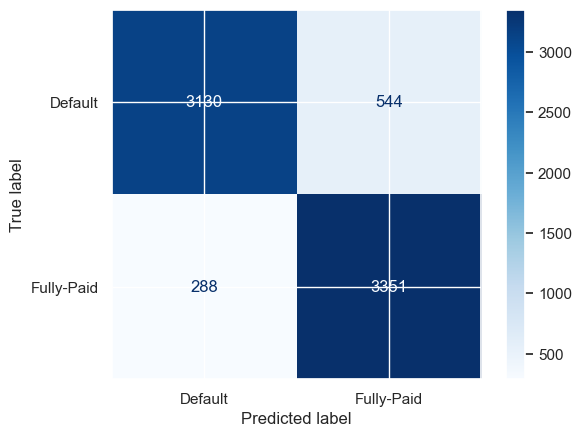

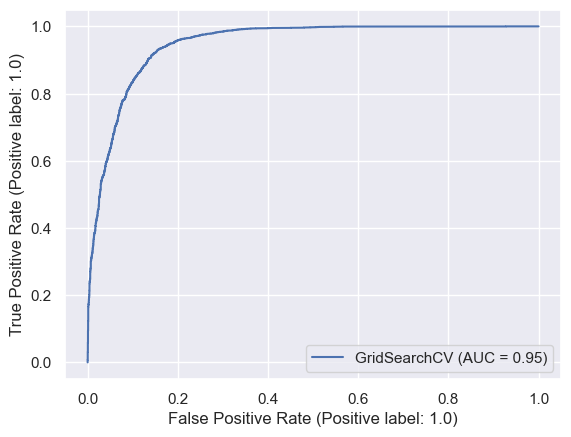

In [ ]:
#Displaying confusion matrix
disp = plot_confusion_matrix(
    clf_hyper, test_X, test_y, 
    cmap='Blues', values_format='d', 
    display_labels=['Default', 'Fully-Paid']
)

#Plotting roc curve
disp = plot_roc_curve(clf_hyper, test_X, test_y)

## **ii. Hyper parameter tuning for XGBoost- RandomizedSearchCV** 

In [ ]:
#setting grid of selected parameters for iteration
param_grid = {'gamma': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4, 200],
              'learning_rate': [0.01, 0.03, 0.06, 0.1, 0.15, 0.2, 0.25, 0.300000012, 0.4, 0.5, 0.6, 0.7],
              'max_depth': [5,6,7,8,9,10,11,12,13,14],
              'n_estimators': [50,65,80,100,115,130,150],
              'reg_alpha': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200],
              'reg_lambda': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200]}

In [ ]:
gcvj = np.cumsum([len(x) for x in param_grid.values()])[-1]
rcvj= gcvj

In [ ]:
#Executing Randomized Search as a hyper parameter technique
randomsearch_clf = RandomizedSearchCV(estimator=xgb_clf, param_distributions=param_grid, scoring='accuracy', return_train_score=True, verbose=1, cv=3, n_iter=rcvj)
randomsearch_clf.fit(train_X, train_y.ravel())

Fitting 3 folds for each of 68 candidates, totalling 204 fits


RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           callbacks=None, colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=0, gpu_id=-1,
                                           grow_policy='depthwise',
                                           importance_type=None,
                                           interaction_constraints='',
                                           learning_rate=0.300...
                                        'learning_rate': [0.01, 0.03, 0.06, 0.1,
                                                          0.15, 0.2, 0.25,
                                                          0.300000012, 0.4, 0.5,
                                                          0.6, 0.7],
                                        'max_depth': [5, 6, 7, 8, 9, 10, 11, 12,
                                                      13, 14],
                                        'n_estimators': [50, 65, 80, 100, 115,
                                                         130, 150],
                                        'reg_alpha': [0, 0.1, 0.2, 0.4, 0.8,
                                                      1.6, 3.2, 6.4, 12.8, 25.6,
                                                      51.2, 102.4, 200],
                                        'reg_lambda': [0, 0.1, 0.2, 0.4, 0.8,
                                                       1.6, 3.2, 6.4, 12.8,
                                                       25.6, 51.2, 102.4,
                                                       200]},
                   return_train_score=True, scoring='accuracy', verbose=1)

In [ ]:
#Implementing XGBoost with RandomizedSearch on our dataset
y_train_pred_hyper2 = randomsearch_clf.predict(train_X)
y_test_pred_hyper2 = randomsearch_clf.predict(test_X)

#Printing performance metrics
print_score(train_y, y_train_pred_hyper2, train=True)
print_score(test_y, y_test_pred_hyper2, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0.0     1.0  accuracy  macro avg  weighted avg
precision     1.0     1.0       1.0        1.0           1.0
recall        1.0     1.0       1.0        1.0           1.0
f1-score      1.0     1.0       1.0        1.0           1.0
support    8514.0  8549.0       1.0    17063.0       17063.0
_______________________________________________
Confusion Matrix: 
 [[8514    0]
 [   0 8549]]

Test Result:
Accuracy Score: 89.87%
_______________________________________________
CLASSIFICATION REPORT:
                   0.0          1.0  accuracy    macro avg  weighted avg
precision     0.929681     0.871538  0.898674     0.900610      0.900749
recall        0.863636     0.934048  0.898674     0.898842      0.898674
f1-score      0.895442     0.901711  0.898674     0.898577      0.898562
support    3674.000000  3639.000000  0.898674  7313.000000   7313.000000
__________________

> Accuracy increased from 88.62% to 89.25% after using RandomizedSearchCV as hyper parameter tuning technique

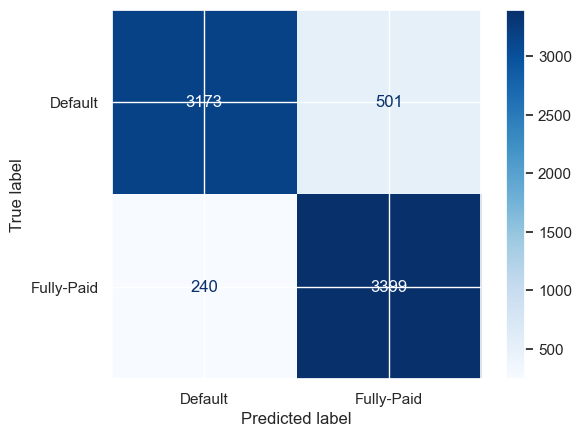

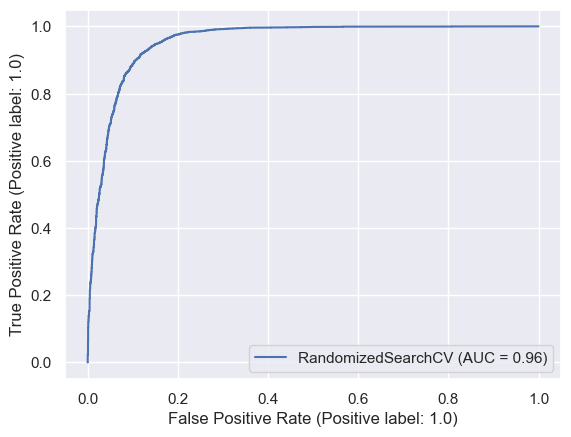

In [ ]:
#Displaying confusion matrix
disp = plot_confusion_matrix(
    randomsearch_clf, test_X, test_y, 
    cmap='Blues', values_format='d', 
    display_labels=['Default', 'Fully-Paid']
)

#Plotting roc curve
disp = plot_roc_curve(randomsearch_clf, test_X, test_y)

## **iii. Hyper parameter tuning for XGBoost- BayesSearchCV** 

In [ ]:
bcvj = int(gcvj)

In [ ]:
#Executing Bayes Search as a hyper parameter technique
bayes_clf = BayesSearchCV(estimator=xgb_clf, search_spaces=param_grid, n_iter=bcvj, scoring='accuracy', cv=3, return_train_score=True, verbose=3)
bayes_clf.fit(train_X, train_y.ravel())

Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV 1/3] END gamma=0.8, learning_rate=0.03, max_depth=10, n_estimators=100, reg_alpha=1.6, reg_lambda=0.8;, score=(train=0.938, test=0.888) total time=   0.9s
[CV 2/3] END gamma=0.8, learning_rate=0.03, max_depth=10, n_estimators=100, reg_alpha=1.6, reg_lambda=0.8;, score=(train=0.936, test=0.887) total time=   0.8s
[CV 3/3] END gamma=0.8, learning_rate=0.03, max_depth=10, n_estimators=100, reg_alpha=1.6, reg_lambda=0.8;, score=(train=0.940, test=0.881) total time=   0.8s
Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV 1/3] END gamma=1.6, learning_rate=0.7, max_depth=14, n_estimators=65, reg_alpha=51.2, reg_lambda=200.0;, score=(train=0.877, test=0.872) total time=   0.3s
[CV 2/3] END gamma=1.6, learning_rate=0.7, max_depth=14, n_estimators=65, reg_alpha=51.2, reg_lambda=200.0;, score=(train=0.878, test=0.871) total time=   0.3s
[CV 3/3] END gamma=1.6, learning_rate=0.7, max_depth=14, n_estimators=65, reg_alpha=5

[CV 2/3] END gamma=0.4, learning_rate=0.4, max_depth=9, n_estimators=50, reg_alpha=1.6, reg_lambda=0.8;, score=(train=0.990, test=0.887) total time=   0.3s
[CV 3/3] END gamma=0.4, learning_rate=0.4, max_depth=9, n_estimators=50, reg_alpha=1.6, reg_lambda=0.8;, score=(train=0.991, test=0.884) total time=   0.3s
Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV 1/3] END gamma=0.2, learning_rate=0.300000012, max_depth=9, n_estimators=100, reg_alpha=1.6, reg_lambda=25.6;, score=(train=0.961, test=0.885) total time=   0.6s
[CV 2/3] END gamma=0.2, learning_rate=0.300000012, max_depth=9, n_estimators=100, reg_alpha=1.6, reg_lambda=25.6;, score=(train=0.961, test=0.890) total time=   0.7s
[CV 3/3] END gamma=0.2, learning_rate=0.300000012, max_depth=9, n_estimators=100, reg_alpha=1.6, reg_lambda=25.6;, score=(train=0.964, test=0.884) total time=   0.7s
Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV 1/3] END gamma=0.2, learning_rate=0.4, max_depth=9, n_estimators=115

[CV 3/3] END gamma=0.2, learning_rate=0.1, max_depth=12, n_estimators=115, reg_alpha=6.4, reg_lambda=0.1;, score=(train=0.949, test=0.881) total time=   0.9s
Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV 1/3] END gamma=0.2, learning_rate=0.4, max_depth=13, n_estimators=130, reg_alpha=0.1, reg_lambda=0.8;, score=(train=1.000, test=0.892) total time=   1.1s
[CV 2/3] END gamma=0.2, learning_rate=0.4, max_depth=13, n_estimators=130, reg_alpha=0.1, reg_lambda=0.8;, score=(train=1.000, test=0.890) total time=   1.1s
[CV 3/3] END gamma=0.2, learning_rate=0.4, max_depth=13, n_estimators=130, reg_alpha=0.1, reg_lambda=0.8;, score=(train=1.000, test=0.885) total time=   1.0s
Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV 1/3] END gamma=0.2, learning_rate=0.4, max_depth=9, n_estimators=80, reg_alpha=0.1, reg_lambda=0.1;, score=(train=1.000, test=0.885) total time=   0.4s
[CV 2/3] END gamma=0.2, learning_rate=0.4, max_depth=9, n_estimators=80, reg_alpha=0.1, reg_la

[CV 1/3] END gamma=0.4, learning_rate=0.1, max_depth=10, n_estimators=100, reg_alpha=3.2, reg_lambda=0.8;, score=(train=0.958, test=0.890) total time=   0.7s
[CV 2/3] END gamma=0.4, learning_rate=0.1, max_depth=10, n_estimators=100, reg_alpha=3.2, reg_lambda=0.8;, score=(train=0.959, test=0.891) total time=   0.7s
[CV 3/3] END gamma=0.4, learning_rate=0.1, max_depth=10, n_estimators=100, reg_alpha=3.2, reg_lambda=0.8;, score=(train=0.961, test=0.884) total time=   0.7s
Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV 1/3] END gamma=0.4, learning_rate=0.25, max_depth=10, n_estimators=115, reg_alpha=0.1, reg_lambda=51.2;, score=(train=0.949, test=0.886) total time=   0.7s
[CV 2/3] END gamma=0.4, learning_rate=0.25, max_depth=10, n_estimators=115, reg_alpha=0.1, reg_lambda=51.2;, score=(train=0.947, test=0.888) total time=   0.8s
[CV 3/3] END gamma=0.4, learning_rate=0.25, max_depth=10, n_estimators=115, reg_alpha=0.1, reg_lambda=51.2;, score=(train=0.951, test=0.879) total 

[CV 2/3] END gamma=0.8, learning_rate=0.03, max_depth=12, n_estimators=115, reg_alpha=0.0, reg_lambda=3.2;, score=(train=0.956, test=0.889) total time=   0.9s
[CV 3/3] END gamma=0.8, learning_rate=0.03, max_depth=12, n_estimators=115, reg_alpha=0.0, reg_lambda=3.2;, score=(train=0.960, test=0.885) total time=   0.9s
Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV 1/3] END gamma=0.2, learning_rate=0.5, max_depth=13, n_estimators=150, reg_alpha=0.0, reg_lambda=102.4;, score=(train=0.969, test=0.891) total time=   1.3s
[CV 2/3] END gamma=0.2, learning_rate=0.5, max_depth=13, n_estimators=150, reg_alpha=0.0, reg_lambda=102.4;, score=(train=0.971, test=0.887) total time=   1.3s
[CV 3/3] END gamma=0.2, learning_rate=0.5, max_depth=13, n_estimators=150, reg_alpha=0.0, reg_lambda=102.4;, score=(train=0.971, test=0.879) total time=   1.3s
Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV 1/3] END gamma=0.1, learning_rate=0.06, max_depth=13, n_estimators=115, reg_alph

BayesSearchCV(cv=3,
              estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                      callbacks=None, colsample_bylevel=1,
                                      colsample_bynode=1, colsample_bytree=1,
                                      early_stopping_rounds=None,
                                      enable_categorical=False,
                                      eval_metric=None, feature_types=None,
                                      gamma=0, gpu_id=-1,
                                      grow_policy='depthwise',
                                      importance_type=None,
                                      interaction_constraints='',
                                      learning_rate=0.30000001...
              search_spaces={'gamma': [0, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4,
                                       12.8, 25.6, 51.2, 102.4, 200],
                             'learning_rate': [0.01, 0.03, 0.06, 0.1, 0.15, 0.2,
                                               0.25, 0.300000012, 0.4, 0.5, 0.6,
                                               0.7],
                             'max_depth': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14],
                             'n_estimators': [50, 65, 80, 100, 115, 130, 150],
                             'reg_alpha': [0, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4,
                                           12.8, 25.6, 51.2, 102.4, 200],
                             'reg_lambda': [0, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2,
                                            6.4, 12.8, 25.6, 51.2, 102.4,
                                            200]},
              verbose=3)

In [ ]:
#Implementing XGBoost with BayesSearch on our dataset
y_train_pred_hyper3 = bayes_clf.predict(train_X)
y_test_pred_hyper3 = bayes_clf.predict(test_X)

#Printing performance metrics
print_score(train_y, y_train_pred_hyper3, train=True)
print_score(test_y, y_test_pred_hyper3, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0.0     1.0  accuracy  macro avg  weighted avg
precision     1.0     1.0       1.0        1.0           1.0
recall        1.0     1.0       1.0        1.0           1.0
f1-score      1.0     1.0       1.0        1.0           1.0
support    8514.0  8549.0       1.0    17063.0       17063.0
_______________________________________________
Confusion Matrix: 
 [[8514    0]
 [   0 8549]]

Test Result:
Accuracy Score: 89.99%
_______________________________________________
CLASSIFICATION REPORT:
                   0.0          1.0  accuracy    macro avg  weighted avg
precision     0.931378     0.872406  0.899904     0.901892      0.902033
recall        0.864453     0.935697  0.899904     0.900075      0.899904
f1-score      0.896669     0.902944  0.899904     0.899806      0.899791
support    3674.000000  3639.000000  0.899904  7313.000000   7313.000000
__________________

> Accuracy increased from 88.62% to 90.02% after using RandomizedSearchCV as hyper parameter tuning technique <br>
Of the 3 hyper parameter tuning techniques, BayesSearchCV gave us the maximum accuracy.

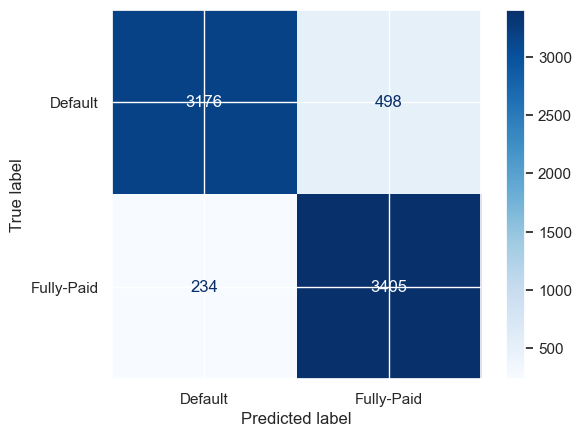

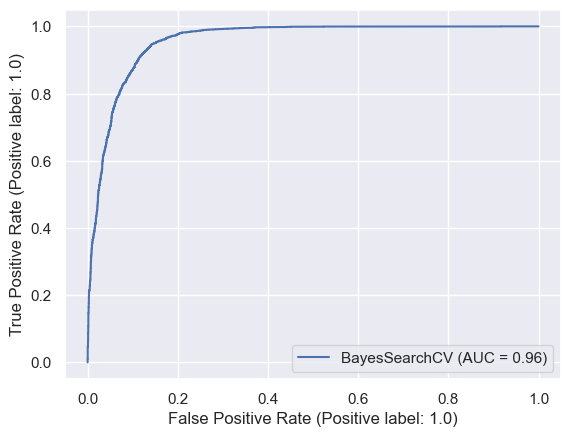

In [ ]:
#Displaying confusion matrix
disp = plot_confusion_matrix(
    bayes_clf, test_X, test_y, 
    cmap='Blues', values_format='d', 
    display_labels=['Default', 'Fully-Paid']
)

#Plotting roc curve
disp = plot_roc_curve(bayes_clf, test_X, test_y)

In [ ]:
#Best scores added to the scores dictionary- In this one- it's BayesSearch
scores_dict['XGBClassifier'] = {
        'Train': roc_auc_score(train_y, bayes_clf.predict(train_X)),
        'Test': roc_auc_score(test_y, bayes_clf.predict(test_X)),
    }

## **3. Random Forest Classifier**

In [ ]:
#Implementing Random Forest Classifier model on our dataset
rf_clf = RandomForestClassifier(n_estimators=100)

rf_clf.fit(train_X, train_y)

y_train_pred = rf_clf.predict(train_X)
y_test_pred = rf_clf.predict(test_X)

#Printing performance metrics
print_score(train_y, y_train_pred, train=True)
print_score(test_y, y_test_pred, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0.0     1.0  accuracy  macro avg  weighted avg
precision     1.0     1.0       1.0        1.0           1.0
recall        1.0     1.0       1.0        1.0           1.0
f1-score      1.0     1.0       1.0        1.0           1.0
support    8514.0  8549.0       1.0    17063.0       17063.0
_______________________________________________
Confusion Matrix: 
 [[8514    0]
 [   0 8549]]

Test Result:
Accuracy Score: 90.33%
_______________________________________________
CLASSIFICATION REPORT:
                   0.0          1.0  accuracy    macro avg  weighted avg
precision     0.941386     0.870951  0.903323     0.906169      0.906338
recall        0.861187     0.945864  0.903323     0.903525      0.903323
f1-score      0.899502     0.906863  0.903323     0.903183      0.903165
support    3674.000000  3639.000000  0.903323  7313.000000   7313.000000
__________________

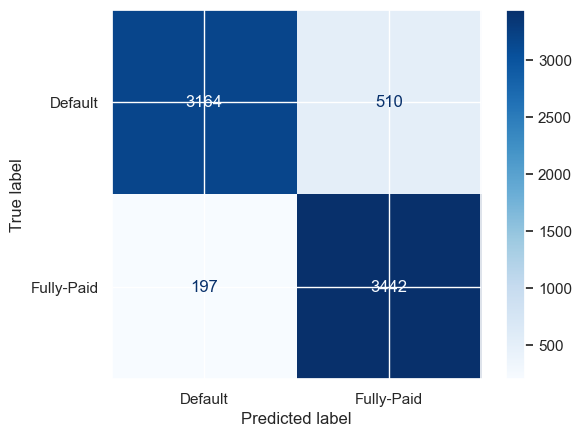

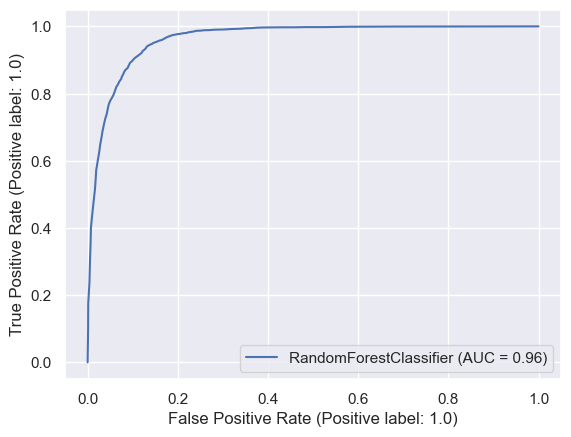

In [ ]:
#Plotting confusion matrix
disp = plot_confusion_matrix(
    rf_clf, test_X, test_y, 
    cmap='Blues', values_format='d', 
    display_labels=['Default', 'Fully-Paid']
)
#Plotting roc curve
disp = plot_roc_curve(rf_clf, test_X, test_y)

## **i. Hyperparameter tuning for RandomForestClassifier- GridSearchCV**

In [ ]:
#Initiliasing values for parameters
max_depth=[2, 8, 16]
n_estimators = [64, 128, 256]
param_grid = dict(max_depth=max_depth, n_estimators=n_estimators)

# Build the grid search
grid = GridSearchCV(estimator=rf_clf, param_grid=param_grid, cv = 5)
grid_results = grid.fit(train_X, train_y)

# Summarize the results in a readable format
print("Best: {0}, using {1}".format(grid_results.cv_results_['mean_test_score'], grid_results.best_params_))


Best: [0.85395304 0.85360145 0.85430467 0.87639911 0.87751259 0.87774702
 0.89485996 0.89474272 0.89503582], using {'max_depth': 16, 'n_estimators': 256}


In [ ]:
#Implementing GridSearchCV on our dataset
y_train_pred_rf = grid_results.predict(train_X)
y_test_pred_rf = grid_results.predict(test_X)

#Printing performance metrics after hyper paramter tuning
print_score(train_y, y_train_pred_rf, train=True)
print_score(test_y, y_test_pred_rf, train=False)

Train Result:
Accuracy Score: 99.04%
_______________________________________________
CLASSIFICATION REPORT:
                   0.0          1.0  accuracy     macro avg  weighted avg
precision     0.998567     0.982620  0.990447      0.990593      0.990577
recall        0.982265     0.998596  0.990447      0.990430      0.990447
f1-score      0.990349     0.990544  0.990447      0.990446      0.990446
support    8514.000000  8549.000000  0.990447  17063.000000  17063.000000
_______________________________________________
Confusion Matrix: 
 [[8363  151]
 [  12 8537]]

Test Result:
Accuracy Score: 90.07%
_______________________________________________
CLASSIFICATION REPORT:
                   0.0          1.0  accuracy    macro avg  weighted avg
precision     0.942377     0.865863  0.900725     0.904120      0.904303
recall        0.854654     0.947238  0.900725     0.900946      0.900725
f1-score      0.896375     0.904724  0.900725     0.900549      0.900529
support    3674.000000  363

> Accuaracy changed from 90.46 to 90.25% after hyper parameter tuning.

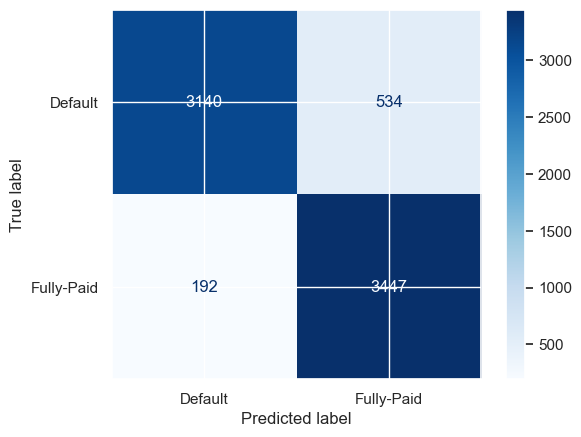

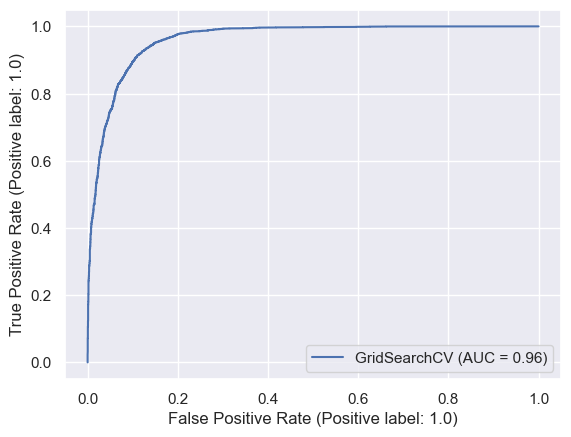

In [ ]:
#Plotting confusion matrix
disp = plot_confusion_matrix(
    grid, test_X, test_y, 
    cmap='Blues', values_format='d', 
    display_labels=['Default', 'Fully-Paid']
)

#Plotting roc curve
disp = plot_roc_curve(grid_results, test_X, test_y)

#### **Best scores added to the scores dictionary**

In [ ]:
scores_dict['RandomForestClassifier'] = {
        'Train': roc_auc_score(train_y, rf_clf.predict(train_X)),
        'Test': roc_auc_score(test_y, rf_clf.predict(test_X)),
    }

# **4. Support Vector** 

In [ ]:
def SVM_Bagging_Randomize_CV(X,y, parameters, k = -1):
    
    # Create Parameter Combination
    keys, values = zip(*parameters.items())
    result = [dict(zip(keys, p)) for p in product(*values)]
    
    if k != -1:

        result = np.random.choice(result, k, replace = False)
        
    best_score = -1
    best_parameter = {}
    best_model = None
    
    # Train Test Split
#     train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.3, random_state=42)
    
    for i in result:
        
        Support_Vector = BaggingClassifier(base_estimator=SVC(**i), 
                                           n_estimators=64,
                                           max_samples = 128, 
                                           random_state=0,
                                           n_jobs = -1)

        Support_Vector.fit(train_X, train_y)
        
        pred = Support_Vector.predict(test_X)
        amex_actual = pd.DataFrame({'target':test_y}).reset_index(drop=True)
        amex_prediction = pd.DataFrame({'prediction': Support_Vector.predict_proba(test_X)[:, 1]}).reset_index(drop=True)
        score = amex_metric(amex_actual,amex_prediction)
        
        if score > best_score:
            best_score = score
            best_parameter = i
            best_model = Support_Vector
        
        print(f'{i}: {score}')
        
    print(f'Best Parameters - {best_parameter}: {best_score}')
    
    return best_model

In [ ]:
# Pools of Parameters   

random_parameters = {'C': [1, 10, 100], 
                     'gamma': [0.1,0.01, 0.001],
                     'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 
                     }

Support_Vector = SVM_Bagging_Randomize_CV(train_X,train_y, random_parameters, 15)

{'C': 100, 'gamma': 0.1, 'kernel': 'poly'}: 0.654207390271484
{'C': 100, 'gamma': 0.001, 'kernel': 'sigmoid'}: 0.5821872194628778
{'C': 10, 'gamma': 0.1, 'kernel': 'poly'}: 0.6531035912612603
{'C': 10, 'gamma': 0.01, 'kernel': 'sigmoid'}: 0.6062610478064681
{'C': 1, 'gamma': 0.01, 'kernel': 'sigmoid'}: 0.5415221854250849
{'C': 100, 'gamma': 0.01, 'kernel': 'poly'}: 0.6325883712561884
{'C': 1, 'gamma': 0.001, 'kernel': 'poly'}: 0.07743412660291593
{'C': 10, 'gamma': 0.01, 'kernel': 'poly'}: 0.5958444408570911
{'C': 1, 'gamma': 0.001, 'kernel': 'sigmoid'}: 0.5209807290698134
{'C': 1, 'gamma': 0.001, 'kernel': 'rbf'}: 0.5245853115669541
{'C': 100, 'gamma': 0.1, 'kernel': 'rbf'}: 0.6367489158153491
{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}: 0.6335970271780386
{'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}: 0.6108259218724963
{'C': 1, 'gamma': 0.1, 'kernel': 'linear'}: 0.5877194221761441
{'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}: 0.5545725128501491
Best Parameters - {'C': 100, 'gamma': 0.1, 'kernel'

In [ ]:
# Validation of the Support Vector model
sv_train_pred= Support_Vector.predict(train_X)
sv_test_pred = Support_Vector.predict(test_X)
# amex_actual = pd.DataFrame({'target':test_y}).reset_index(drop=True)
# amex_prediction = pd.DataFrame({'prediction': Support_Vector.predict_proba(test_X)[:, 1]}).reset_index(drop=True)


In [ ]:
#Printing performance metrics 
print_score(train_y, sv_train_pred, train=True)
print_score(test_y, sv_test_pred, train=False)

Train Result:
Accuracy Score: 87.00%
_______________________________________________
CLASSIFICATION REPORT:
                   0.0          1.0  accuracy     macro avg  weighted avg
precision     0.893487     0.849184  0.869953      0.871335      0.871290
recall        0.839441     0.900339  0.869953      0.869890      0.869953
f1-score      0.865621     0.874014  0.869953      0.869817      0.869826
support    8514.000000  8549.000000  0.869953  17063.000000  17063.000000
_______________________________________________
Confusion Matrix: 
 [[7147 1367]
 [ 852 7697]]

Test Result:
Accuracy Score: 87.17%
_______________________________________________
CLASSIFICATION REPORT:
                   0.0          1.0  accuracy    macro avg  weighted avg
precision     0.895147     0.850688  0.871735     0.872918      0.873024
recall        0.843495     0.900247  0.871735     0.871871      0.871735
f1-score      0.868554     0.874766  0.871735     0.871660      0.871645
support    3674.000000  363

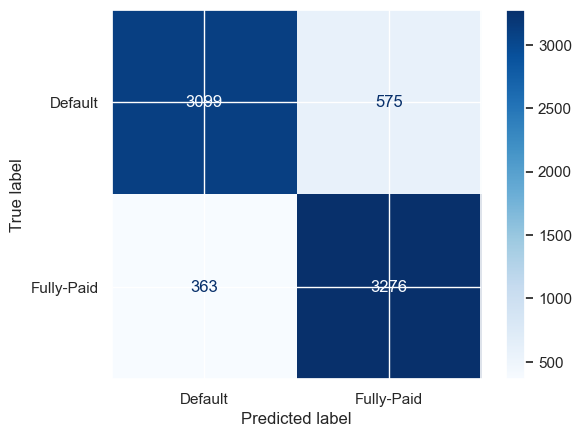

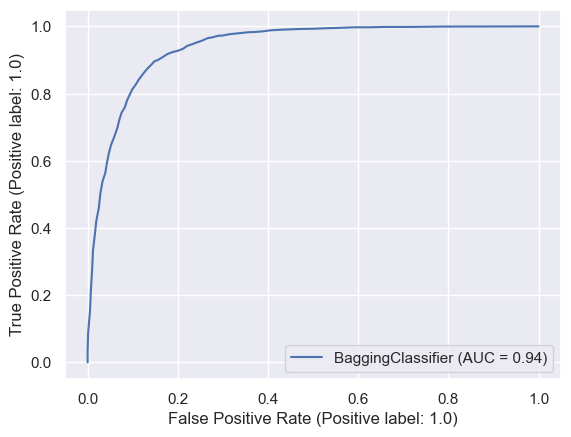

In [ ]:
disp = plot_confusion_matrix(Support_Vector, test_X, test_y, 
                             cmap='Blues', values_format='d', 
                             display_labels=['Default', 'Fully-Paid'])

disp = plot_roc_curve(Support_Vector, test_X, test_y)

## **ROC Curves of all models** 

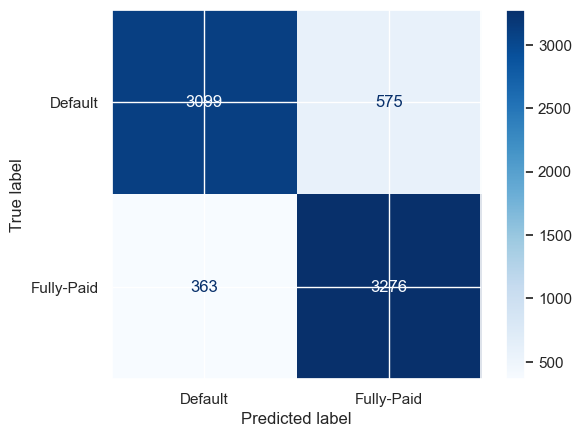

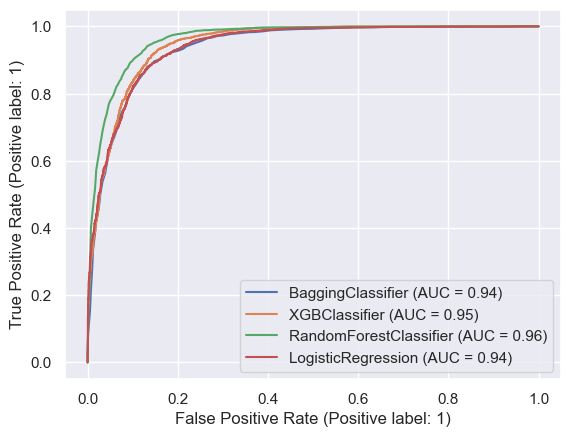

In [ ]:
disp = plot_confusion_matrix(Support_Vector, test_X, test_y, 
                             cmap='Blues', values_format='d', 
                             display_labels=['Default', 'Fully-Paid'])

disp = plot_roc_curve(Support_Vector, test_X, test_y)
plot_roc_curve(xgb_clf, test_X, test_y, ax=disp.ax_)
plot_roc_curve(rf_clf, test_X, test_y, ax=disp.ax_)
plot_roc_curve(Logit, test_X, test_y, ax=disp.ax_)

In [ ]:
scores_dict['Support_Vector'] = {
        'Train': roc_auc_score(train_y, Support_Vector.predict(train_X)),
        'Test': roc_auc_score(test_y, Support_Vector.predict(test_X)),
    }

In [ ]:
ml_models = {
    'Logistic Regression': Logit,
    'XGBoost': xgb_clf,
    'Random Forest': rf_clf, 
    'Support Vector': Support_Vector
    
}

for model in ml_models:
    print(f"{model.upper():{30}} roc_auc_score: {roc_auc_score(test_y, ml_models[model].predict(test_X)):.3f}")

LOGISTIC REGRESSION            roc_auc_score: 0.872
XGBOOST                        roc_auc_score: 0.886
RANDOM FOREST                  roc_auc_score: 0.904
SUPPORT VECTOR                 roc_auc_score: 0.872


# **V. Summarised Visualization** 

In [ ]:
scores_df = pd.DataFrame(scores_dict)
scores_df.hvplot.barh(
    width=500, height=400, 
    title="ROC Scores of ML Models", xlabel="ROC Scores", 
    alpha=0.4, legend='top'
)

# import holoviews as hv

# labels = hv.Labels(data=df, kdims=['LogisticRegression', 'XGBClassifier', 'RandomForestClassifier', 'Support_Vector'], vdims=['Train', 'Test'])

# # use the * symbol to overlay your labels on your plot
# plot * labels


:Bars   [index,Variable]   (value)

## **SUMMARY** 

1) We performed data preprocessing on this dataset-
Null value handling: Data imputation was performed by Mean, Median and Mode to analyse the effect of each imputation method 

2) We performed Exploratory Data Analysis of the profile variables- Delinquency, Spend, Payment, Balance, Risk. 
We did a Distribution analysis of all the variables to understand if it's skewed or normally distributed. Most variables showed a skewed distrbution. 
We plotted a correlation of the independent features with the target.


3) Feature Engineering: We performed Dimensionality Reduction using Principal component Analysis

4) We implemented 4 models <br>
        &emsp;         1) **Logistic regression** <br>
        &emsp;         2) **XGBoost** <br>
        &emsp;         3) **RandomForestClassifier** <br>
        &emsp;         4) **Support Vector** <br>

5) Hyperparameter Tuning for was performed for each model along with 3 tecnhiques implemented for XGBoost <br>
        &emsp;         1) **XGBoost Classifier with GridSearch**  <br>
        &emsp;         2) **XGBoost with RandomizedSearchCV** <br>
        &emsp;         3) **XGBoost with BayesSearchCV** <br>
        &emsp;         4) **RandomForestClassifier using GridSearchCV** <br>

6) We analysed the accuracies of each model- with and without hyper paramater tuning to understand which model works best for ou dataset. Summarised visualization plotted to shows the results.

## **RESULTS AND CONCLUSION**

**1) Logistic Regression**, after hyperparameter tuning, gave an accuracy of **87.21%** <br>

**2) XGBoost** gave an accuracy of **88.62%** <br>
After hyperparameter tuning: <br>
 &emsp;            1) GridSearch: **88.62%** <br>
 &emsp;            2) RandomizedSearch: **89.25%** <br>
 &emsp;            3) BayesSearch: **90.02%** <br>
 

**3) RandomForestClassifier** gave an accuracy of **90.46%** <br>
After hyperparameter tuning: <br>
 &emsp;            GridSearch: **90.25%** <br>
This was the only case to record a lower accuracy (0.2%) after hyper parameter tuning


**4) Support Vector** after hyperparameter tuning, gave an accuracy of **86.44%** <br>


After a comparative study on the models above, we come to a conclusion that the classification model using **RandomForestClassifier** is the best model with an accuracy score of **90.46%** without and **90.25%** with hyperparameter tuning.

## **REFERENCES**


1. https://www.kaggle.com/code/girishkumarsahu/american-express-default-prediction-ml-model

2. https://www.kaggle.com/code/devsubhash/amex-eda-default-prediction

3. https://www.kaggle.com/code/jinweitu/amex-default-prediction-with-lgbm-model-comparison

4. https://towardsdatascience.com/hyperparameter-tuning-in-python-21a76794a1f7

## **LICENSE** 

Copyright (c) 2022
Sathwik Hegde

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software. italicized text

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.